# GEEANNT version 0.7

Starting back creating an organized python package

We try to import u_v and u_r in the model via quantile transformation to reduce the input file size

In [1]:
# ==========================================================
# Imports
# ==========================================================
import os
os.environ["CUDA_VISIBLE_DEVICES"] = "-1"
os.environ["TF_CPP_MIN_LOG_LEVEL"] = "2"   # reduce TensorFlow log verbosity

import random
import time

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from IPython.display import Image

import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing

import scipy.stats as st
from scipy.stats import chi2, norm, ks_2samp, wasserstein_distance
from scipy.optimize import curve_fit
from scipy.interpolate import interp1d
from scipy.constants import c, m_e

from astropy.stats import poisson_conf_interval

from brokenaxes import brokenaxes
from matplotlib.gridspec import GridSpec
from matplotlib.patches import FancyArrowPatch
from matplotlib import ticker
from mpl_toolkits.mplot3d.proj3d import proj_transform
from mpl_toolkits.mplot3d.axes3d import Axes3D

# Hyperparameter optimization
import optuna

# ==========================================================
# TensorFlow / Keras
# Force CPU for this project, since it is faster than tf-metal
# for this specific custom CVAE on the M1 MacBook Air
# ==========================================================
import tensorflow as tf
tf.config.set_visible_devices([], "GPU")

from tensorflow import keras
from tensorflow.keras import layers
from keras import regularizers

# ==========================================================
# Version / device checks
# ==========================================================
print("TensorFlow version:", tf.__version__)
print("Keras version     :", keras.__version__)

print("\nPhysical devices  :", tf.config.list_physical_devices())
print("Physical GPU(s)   :", tf.config.list_physical_devices("GPU"))

print("\nLogical devices   :", tf.config.list_logical_devices())
print("Logical GPU(s)    :", tf.config.list_logical_devices("GPU"))

TensorFlow version: 2.16.2
Keras version     : 3.12.1

Physical devices  : [PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU'), PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
Physical GPU(s)   : [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

Logical devices   : [LogicalDevice(name='/device:CPU:0', device_type='CPU')]
Logical GPU(s)    : []


In [2]:
import GEEANNT as ge
print(ge.__file__)
print(ge.__version__)
print(ge.CVAE_CatEnergy_CatUV)
print(ge.CVAE_CatEnergy_CatUV_TaskAdaptive)

ge.initialize_environment(seed=42)


/Volumes/X10Pro/MAGI/GEEANNT_package/GEEANNT/__init__.py
0.7.0
<class 'GEEANNT.core.model.CVAE_CatEnergy_CatUV'>
<class 'GEEANNT.core.model.CVAE_CatEnergy_CatUV_TaskAdaptive'>


## Dataset Import and Checks

In [66]:
df = ge.load_detector_table(
    filepath="/Volumes/X10Pro/MAGI/TrainingData/alloutputDSCryoSphereSmall.dat"
)

center = (0.0, 0.0, -507.66)
R = 100.0

ge.report_basic_table_checks(df)

prep = ge.build_physical_features(
    df,
    center=center,
    radius=R,
)

ge.print_physical_summary(prep)

# Base diagnostic objects
feat_base = prep["features"]
raw = prep["raw"]
proj = prep["projected"]
normdir = prep["normalized_direction"]
derived = prep["derived"]

# ==========================================================
# v0.7a feature dataframe:
#   u_r -> QuantileTransformer
#   u_v -> QuantileTransformer
#   no u_v discretization
# ==========================================================

feature_pack = ge.build_feature_dataframe(
    prep,
    energy_binning_mode="log_fixed_count",
    n_bins=512,
    geometry_transform="quantile_u_r_u_v",
    n_quantiles=512,
    random_state=42,
)

ge.report_feature_dataframe(feature_pack)

feat = feature_pack["feat"]
energy_bins = feature_pack["energy_bins"]
n_energy_bins = feature_pack["n_energy_bins"]

quantile_transformers = feature_pack["quantile_transformers"]
geometry_metadata = feature_pack["geometry_metadata"]

qt_u_r = quantile_transformers["qt_u_r"]
qt_u_v = quantile_transformers["qt_u_v"]

print("Feature columns:", feat.columns.tolist())
print("Geometry metadata:", geometry_metadata)

/Volumes/X10Pro/MAGI/GEEANNT_package/GEEANNT/data/io.py:51: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support sep=None with delim_whitespace=False; you can avoid this warning by specifying engine='python'.
  df = pd.read_table(


N rows: 1873609
  ParticleName    Energy        X         Y        Z        Vx        Vy  \
0        gamma  0.150271  19.6164  90.88580 -473.600  0.096896 -0.990521   
1        gamma  0.091620 -31.8887 -82.91700 -463.909  0.913246  0.194270   
2        gamma  0.113628  94.9088   9.60548 -481.123 -0.169791  0.894456   
3        gamma  0.305449 -47.4416 -25.87610 -424.650  0.697276 -0.601885   
4        gamma  0.258675  21.8070  91.71120 -537.841 -0.668961 -0.634526   

         Vz  
0 -0.097358  
1 -0.358107  
2 -0.413667  
3 -0.389283  
4 -0.387128  

NaN per column:
 ParticleName    0
Energy          0
X               0
Y               0
Z               0
Vx              0
Vy              0
Vz              0
dtype: int64

--- RAW sphere check ---
r: mean = 99.23411918434232 std = 0.40461867908293037 min = 98.93981564523723 max = 100.06006989051981
Mean absolute deviation from R: 0.7682885734999307

--- RAW direction norm check ---
||v||: mean = 0.9999999998903653 std = 2.8861366412906

In [67]:
ge.set_plot_theme("light")

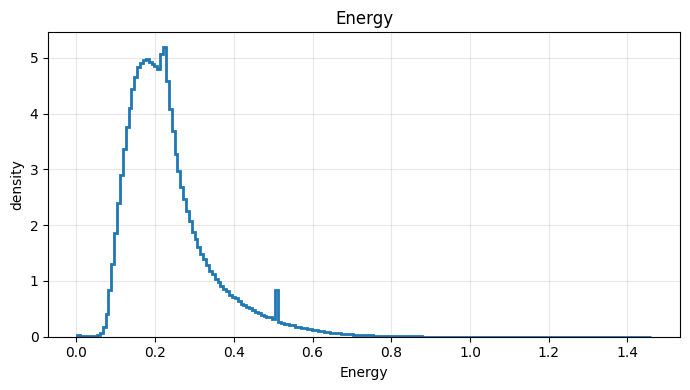

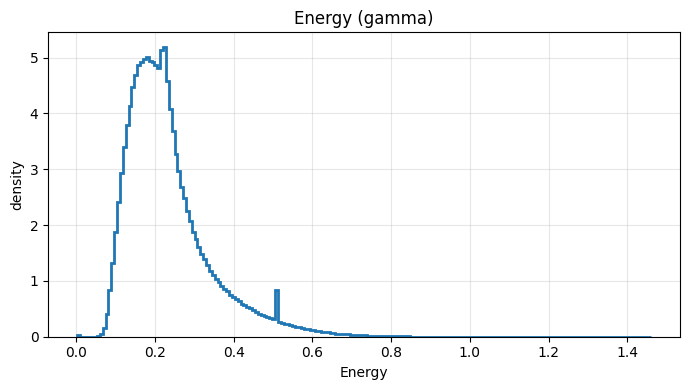

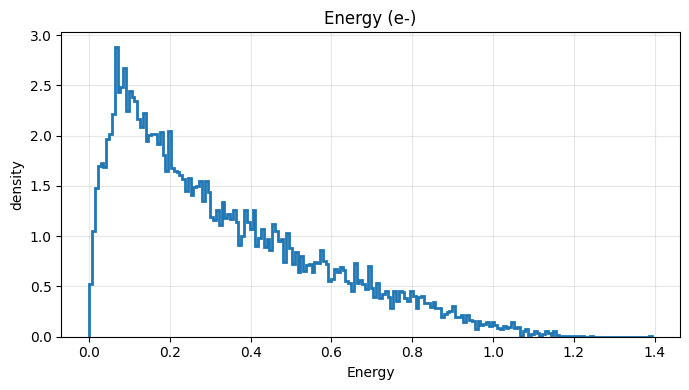

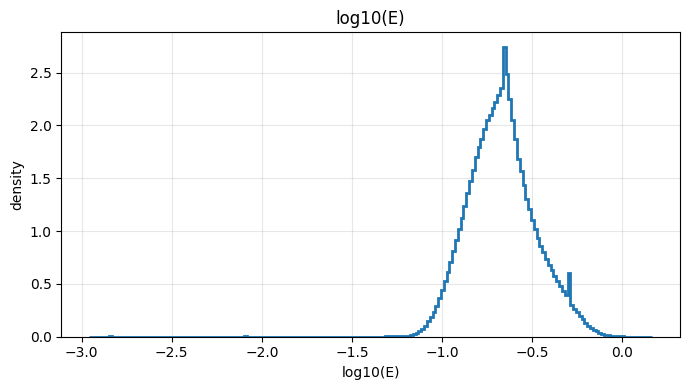

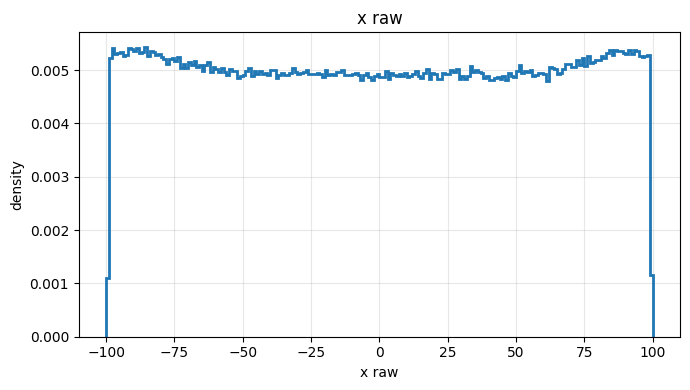

...

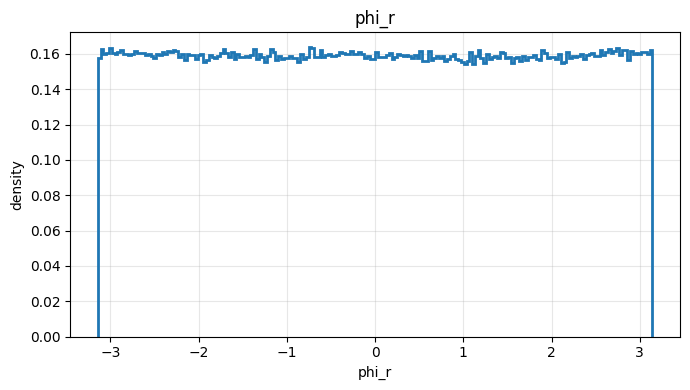

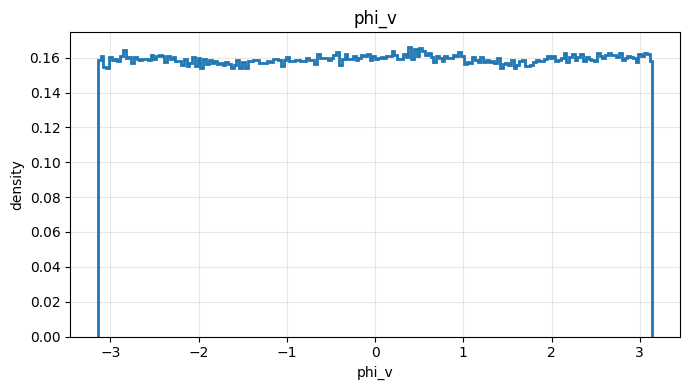

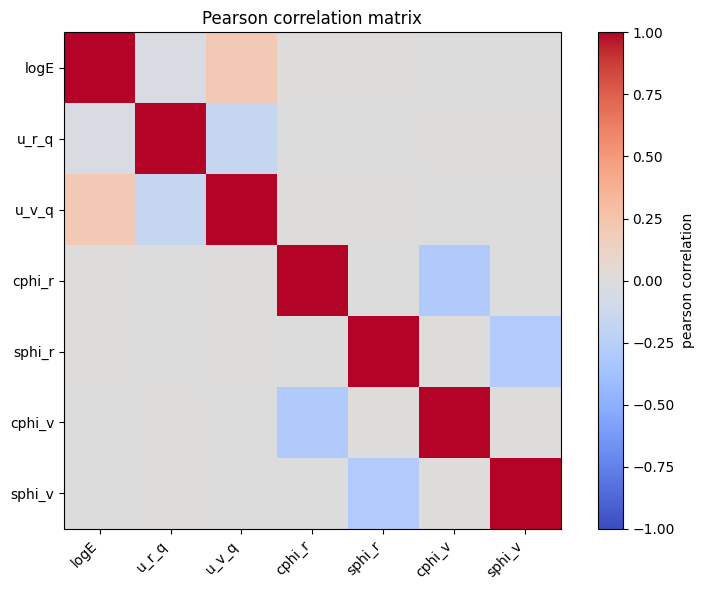

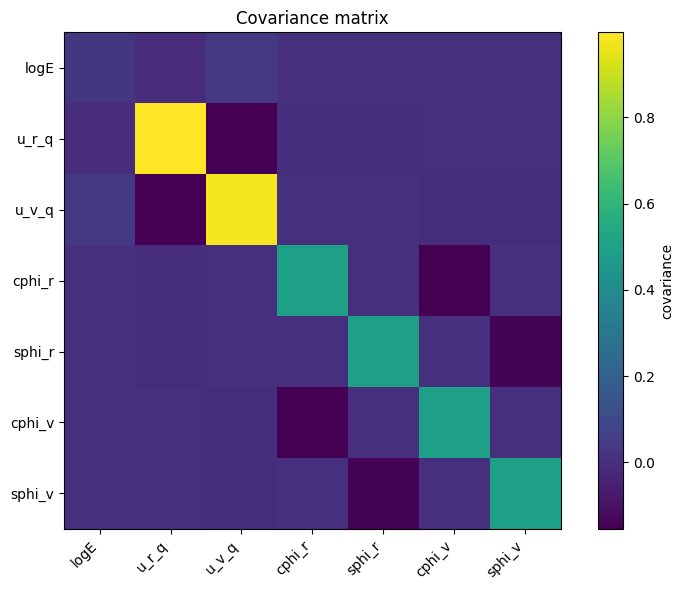

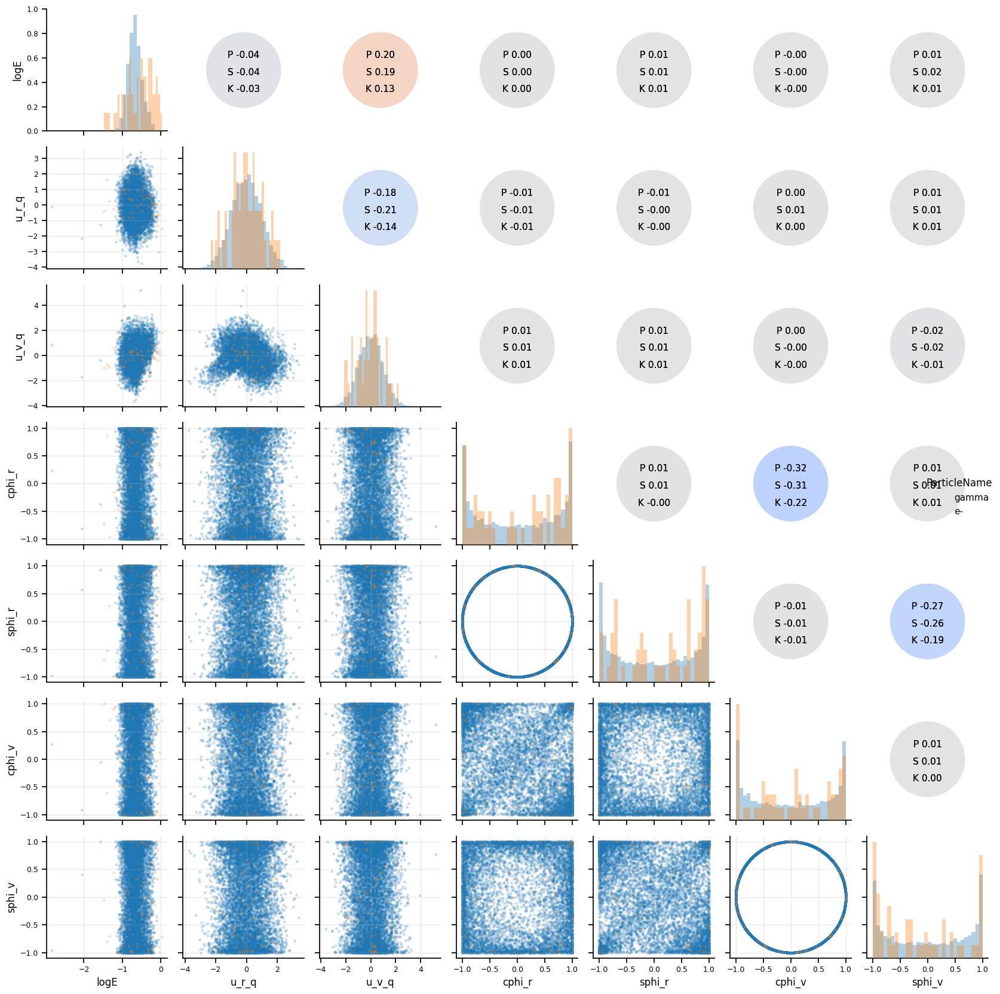

In [68]:
# ==========================================================
# Energy diagnostics from base physical features
# ==========================================================

ge.plot_dist(feat_base["Energy"], "Energy")
ge.plot_dist_by_class(feat_base, "Energy", selected_class="gamma")
ge.plot_dist_by_class(feat_base, "Energy", selected_class="e-")
ge.plot_dist(feat_base["logE"], "log10(E)")

# ==========================================================
# Raw / projected geometry
# ==========================================================

ge.plot_dist(raw["x"], "x raw")
ge.plot_dist(raw["y"], "y raw")
ge.plot_dist(raw["z"], "z raw")
ge.plot_dist(raw["r"], "r raw")

ge.plot_dist(proj["x"], "x projected")
ge.plot_dist(proj["y"], "y projected")
ge.plot_dist(proj["z"], "z projected")

# ==========================================================
# Direction diagnostics
# ==========================================================

ge.plot_dist(normdir["vx"], "vx")
ge.plot_dist(normdir["vy"], "vy")
ge.plot_dist(normdir["vz"], "vz")

# ==========================================================
# Legacy raw geometry variables
# ==========================================================

ge.plot_dist(feat_base["u_r"], "u_r raw = cos(theta_r)", range_=(-1, 1))
ge.plot_dist(feat_base["s_r"], "s_r = arctanh(u_r)")

ge.plot_dist(feat_base["u_v"], "u_v raw = cos(theta_v)", range_=(-1, 1))

# ==========================================================
# v0.7a quantile-normal variables
# ==========================================================

ge.plot_dist(feat["u_r_q"], "u_r quantile-normal")
ge.plot_dist(feat["u_v_q"], "u_v quantile-normal")

# ==========================================================
# Angular variables still encoded as cos/sin
# ==========================================================

ge.plot_dist(feat["cphi_r"], "cos(phi_r)", range_=(-1, 1))
ge.plot_dist(feat["sphi_r"], "sin(phi_r)", range_=(-1, 1))
ge.plot_dist(feat["cphi_v"], "cos(phi_v)", range_=(-1, 1))
ge.plot_dist(feat["sphi_v"], "sin(phi_v)", range_=(-1, 1))

ge.plot_dist(derived["phi_r"], "phi_r", range_=(-np.pi, np.pi))
ge.plot_dist(derived["phi_v"], "phi_v", range_=(-np.pi, np.pi))

# ==========================================================
# Correlation / covariance matrix for v0.7a features
# ==========================================================

corr_df = feat.copy()
corr_df["logE"] = feat_base.loc[feature_pack["mask_energy"], "logE"].reset_index(drop=True)

corr_cols = [
    "logE",
    "u_r_q",
    "u_v_q",
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

corr = ge.plot_correlation_matrix(corr_df, corr_cols, method="pearson")
cov = ge.plot_covariance_matrix(corr_df, corr_cols)

# ==========================================================
# Pairgrid for v0.7a
# ==========================================================

ge.plot_pairgrid_physics(
    corr_df,
    cols=corr_cols,
    class_col="ParticleName",
    sample_size=8000,
    lower_mode="scatter",
    bins=30,
    contour_levels=8,
    figsize_scale=2.4,
    theme="light",
    palette="tab10",
)

plt.show()

In [69]:
feature_pack = ge.build_feature_dataframe(
    prep,
    energy_binning_mode="log_fixed_count",
    e_min_cut=0.05,
    e_max_cut=0.8,
    bin_width=0.500,
    n_bins=256,
    min_counts=20,

    # v0.7a
    geometry_transform="quantile_u_r_u_v",
    n_quantiles=10000,
    random_state=42,
)

ge.report_feature_dataframe(feature_pack)

feat = feature_pack["feat"]

energy_bins = feature_pack["energy_bins"]
n_energy_bins = feature_pack["n_energy_bins"]

prep = feature_pack["filtered_prep"]

# new objects
quantile_transformers = feature_pack["quantile_transformers"]

qt_u_r = quantile_transformers["qt_u_r"]
qt_u_v = quantile_transformers["qt_u_v"]

geometry_metadata = feature_pack["geometry_metadata"]

print(geometry_metadata)



feat shape: (1870448, 8)
geometry_transform: quantile_u_r_u_v

First rows:
  ParticleName  E_idx    cphi_r    sphi_r    cphi_v    sphi_v     u_r_q  \
0        gamma    101  0.210977  0.977491  0.097358 -0.995249  0.212876   
1        gamma     55 -0.358955 -0.933355  0.978114  0.208069  0.377008   
2        gamma     75  0.994918  0.100693 -0.186496  0.982456  0.100361   
3        gamma    167 -0.877904 -0.478836  0.756988 -0.653428  1.172642   
4        gamma    151  0.231329  0.972875 -0.725534 -0.688187 -0.705065   

      u_v_q  
0  1.111766  
1  0.234552  
2  0.091846  
3  0.158420  
4  0.163098  

--- Finite check ---
Rows with NaN/Inf: 0

--- Feature ranges ---
     E_idx : 0  255
    cphi_r : -1.0  1.0
    sphi_r : -1.0  1.0
    cphi_v : -1.0  1.0
    sphi_v : -1.0  1.0
     u_r_q : -5.199337482452393  5.199337482452393
     u_v_q : -5.199337482452393  5.199337482452393

--- Unit circle checks ---
position: mean = 1.0 std = 2.5750332e-08 min = 0.99999994 max = 1.0
direction: m

## Standardization and Preprocessing

Dataset mode: continuous_geometry
Kept particle types: 2
Types: ['gamma', 'e-']

Empirical probabilities:
       gamma  p=9.936218e-01
          e-  p=6.378202e-03

Shapes:
X_cont_raw: (1870433, 6)
E_idx     : (1870433,)
y_type    : (1870433,)

--- Continuous feature ranges ---
   u_r_q : -5.199337482452393  5.199337482452393
   u_v_q : -5.199337482452393  5.199337482452393
  cphi_r : -1.0  1.0
  sphi_r : -1.0  1.0
  cphi_v : -1.0  1.0
  sphi_v : -1.0  1.0

--- Continuous means/std ---
   u_r_q : mean=-0.017219  std= 1.005164
   u_v_q : mean=-0.011700  std= 1.018385
  cphi_r : mean=-0.002377  std= 0.708139
  sphi_r : mean=-0.001682  std= 0.706067
  cphi_v : mean= 0.001015  std= 0.709019
  sphi_v : mean= 0.002079  std= 0.705185

First rows:
  ParticleName  E_idx    cphi_r    sphi_r    cphi_v    sphi_v     u_r_q  \
0        gamma    101  0.210977  0.977491  0.097358 -0.995249  0.212876   
1        gamma     55 -0.358955 -0.933355  0.978114  0.208069  0.377008   
2        gamma     75  0.

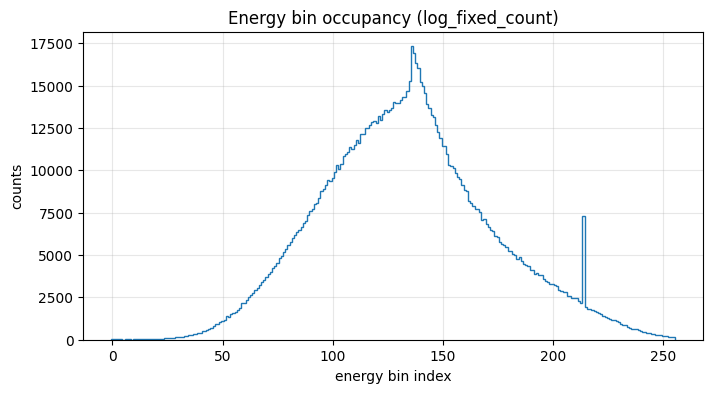

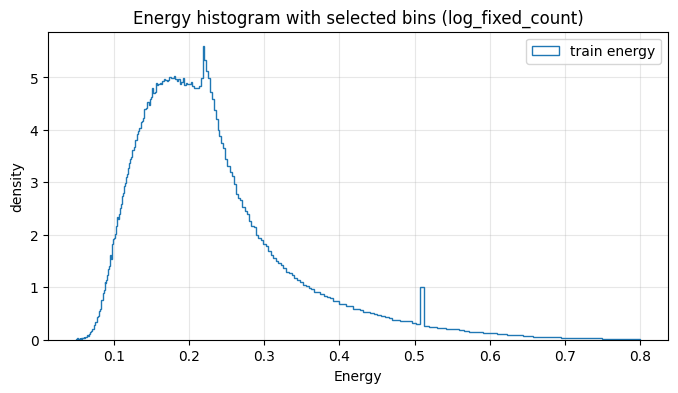

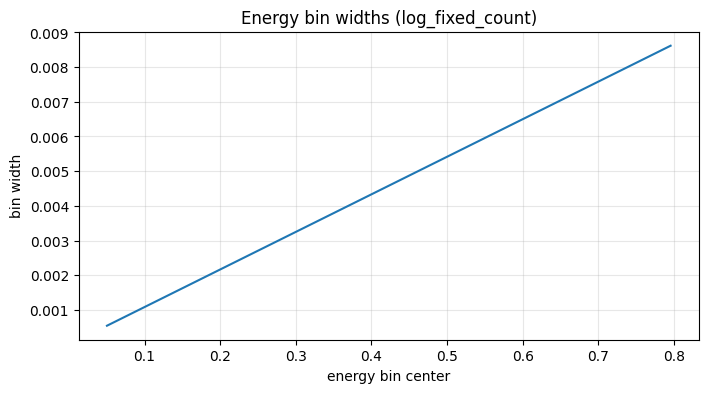

In [70]:
dataset_pack = ge.filter_particle_types_continuous_geometry(
    feat=feature_pack["feat"],
    prob_threshold=1e-5,
    cont_cols=("u_r_q", "u_v_q", "cphi_r", "sphi_r", "cphi_v", "sphi_v"),
)

ge.report_continuous_geometry_features(dataset_pack)

split_pack = ge.split_feature_data(
    dataset_pack,
    test_size_total=0.30,
    val_size_from_temp=0.50,
    random_state=42,
)

ge.report_split_summary(split_pack, n_types=dataset_pack["n_types"])

scaled_pack = ge.scale_continuous_features(
    split_pack,
    scale_cols=(),   # no StandardScaler: u_r_q/u_v_q already quantile-normalized
)

ge.report_scaled_features(scaled_pack)

condition_pack = ge.build_conditioning_and_weights(
    scaled_pack,
    n_types=dataset_pack["n_types"],
    idx_to_type=dataset_pack["idx_to_type"],
    alpha=0.5,
)

ge.report_conditioning(condition_pack, n_types=dataset_pack["n_types"])

tf_pack = ge.build_tf_datasets(
    condition_pack,
    batch_size=4096,
    shuffle_buffer_cap=200_000,
)

ge.report_tf_datasets(tf_pack)

ge.report_energy_binning_diagnostics(
    energy_bins=feature_pack["energy_bins"],
    E_idx=dataset_pack["E_idx"],
    E_values=feature_pack["filtered_prep"]["features"]["Energy"].to_numpy(),
    idx_train=split_pack["idx_train"],
    energy_binning_mode=feature_pack["energy_config"]["mode"],
    bin_width=feature_pack["energy_config"]["bin_width"],
    n_bins=feature_pack["energy_config"]["n_bins"],
    min_counts=feature_pack["energy_config"]["min_counts"],
)

In [71]:
feat = dataset_pack["feat"]

X_cont_train_s = tf_pack["X_cont_train_s"]
X_cont_val_s = tf_pack["X_cont_val_s"]
X_cont_test_s = tf_pack["X_cont_test_s"]

E_train = tf_pack["E_train"]
E_val = tf_pack["E_val"]
E_test = tf_pack["E_test"]

cond_train = tf_pack["cond_train"]
cond_val = tf_pack["cond_val"]
cond_test = tf_pack["cond_test"]

train_ds = tf_pack["train_ds"]
val_ds = tf_pack["val_ds"]
test_ds = tf_pack["test_ds"]

type_weights = tf_pack["type_weights"]

n_types = dataset_pack["n_types"]
idx_to_type = dataset_pack["idx_to_type"]
type_probs = dataset_pack["type_probs"]

cont_cols = dataset_pack["cont_cols"]
Y_CONT_DIM = X_cont_train_s.shape[1]

quantile_transformers = feature_pack["quantile_transformers"]
qt_u_r = quantile_transformers["qt_u_r"]
qt_u_v = quantile_transformers["qt_u_v"]

geometry_metadata = feature_pack["geometry_metadata"]

print("Y_CONT_DIM:", Y_CONT_DIM)
print("cont_cols:", cont_cols)
print("geometry_metadata:", geometry_metadata)

Y_CONT_DIM: 6
cont_cols: ['u_r_q', 'u_v_q', 'cphi_r', 'sphi_r', 'cphi_v', 'sphi_v']
geometry_metadata: {'geometry_transform': 'quantile_u_r_u_v', 'quantile_output_distribution': 'normal', 'quantile_n_quantiles': 10000, 'random_state': 42, 'X_cont_cols': ['u_r_q', 'u_v_q', 'cphi_r', 'sphi_r', 'cphi_v', 'sphi_v']}


In [72]:
# ==========================================================
# Recover all main objects from package outputs - v0.7
# ==========================================================

feat = dataset_pack["feat"]

# scaled / model-side
X_cont_train_s = tf_pack["X_cont_train_s"]
X_cont_val_s = tf_pack["X_cont_val_s"]
X_cont_test_s = tf_pack["X_cont_test_s"]

# unscaled / physics-side
X_cont_train = tf_pack["X_cont_train"]
X_cont_val = tf_pack["X_cont_val"]
X_cont_test = tf_pack["X_cont_test"]

# categorical energy indices
E_train = tf_pack["E_train"]
E_val = tf_pack["E_val"]
E_test = tf_pack["E_test"]

# raw physical energy references
E_all_filtered = feature_pack["filtered_prep"]["features"]["Energy"].to_numpy()

E_train_raw = E_all_filtered[split_pack["idx_train"]]
E_val_raw = E_all_filtered[split_pack["idx_val"]]
E_test_raw = E_all_filtered[split_pack["idx_test"]]

# raw physical u_r/u_v references, useful for validation
u_r_all_raw = feature_pack["filtered_prep"]["features"]["u_r"].to_numpy()
u_v_all_raw = feature_pack["filtered_prep"]["features"]["u_v"].to_numpy()

u_r_train_raw = u_r_all_raw[split_pack["idx_train"]]
u_r_val_raw = u_r_all_raw[split_pack["idx_val"]]
u_r_test_raw = u_r_all_raw[split_pack["idx_test"]]

u_v_train_raw = u_v_all_raw[split_pack["idx_train"]]
u_v_val_raw = u_v_all_raw[split_pack["idx_val"]]
u_v_test_raw = u_v_all_raw[split_pack["idx_test"]]

# conditioning
cond_train = tf_pack["cond_train"]
cond_val = tf_pack["cond_val"]
cond_test = tf_pack["cond_test"]

# datasets
train_ds = tf_pack["train_ds"]
val_ds = tf_pack["val_ds"]
test_ds = tf_pack["test_ds"]

# weights / probabilities
type_weights = tf_pack["type_weights"]
type_probs = dataset_pack["type_probs"]

# metadata
n_types = dataset_pack["n_types"]
idx_to_type = dataset_pack["idx_to_type"]
cont_cols = dataset_pack["cont_cols"]
Y_CONT_DIM = X_cont_train_s.shape[1]

# v0.7 quantile transformers
quantile_transformers = feature_pack["quantile_transformers"]
qt_u_r = quantile_transformers["qt_u_r"]
qt_u_v = quantile_transformers["qt_u_v"]

geometry_metadata = feature_pack["geometry_metadata"]

print("Y_CONT_DIM:", Y_CONT_DIM)
print("cont_cols:", cont_cols)
print("geometry_metadata:", geometry_metadata)

Y_CONT_DIM: 6
cont_cols: ['u_r_q', 'u_v_q', 'cphi_r', 'sphi_r', 'cphi_v', 'sphi_v']
geometry_metadata: {'geometry_transform': 'quantile_u_r_u_v', 'quantile_output_distribution': 'normal', 'quantile_n_quantiles': 10000, 'random_state': 42, 'X_cont_cols': ['u_r_q', 'u_v_q', 'cphi_r', 'sphi_r', 'cphi_v', 'sphi_v']}


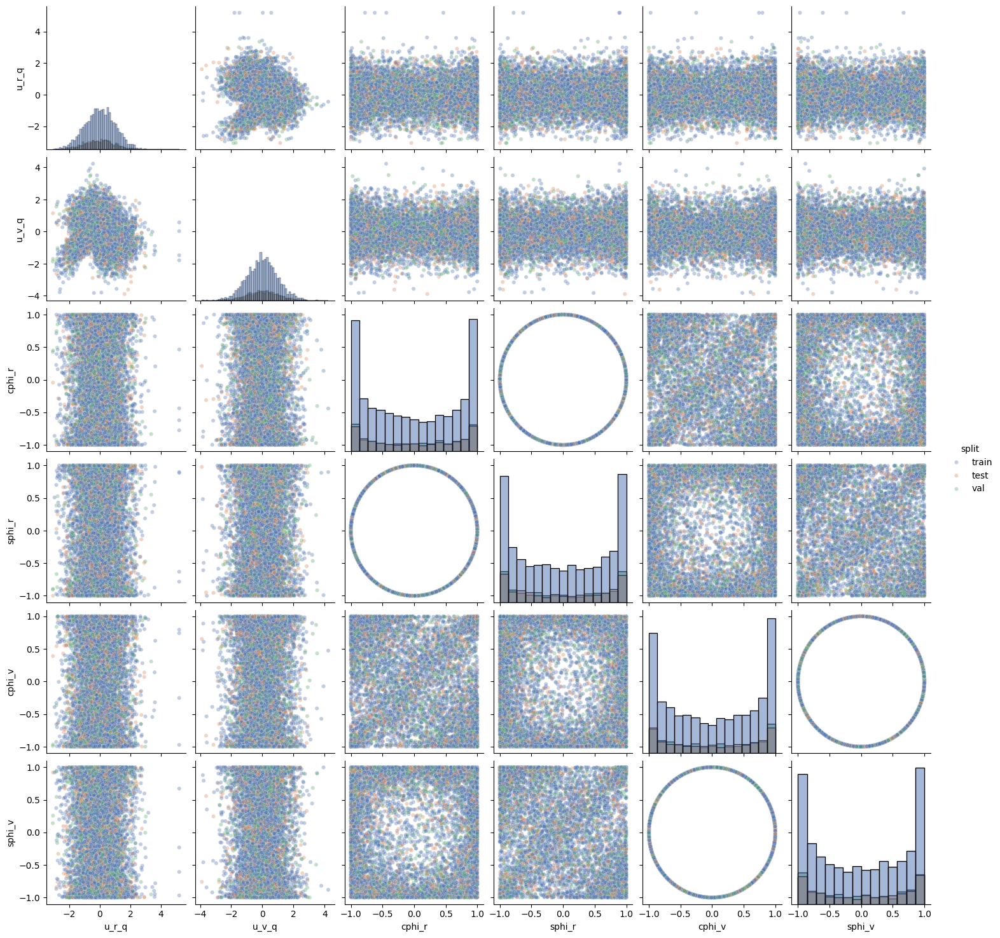

In [33]:
df_train_plot = dataset_pack["feat"].iloc[split_pack["idx_train"]].copy()
df_val_plot   = dataset_pack["feat"].iloc[split_pack["idx_val"]].copy()
df_test_plot  = dataset_pack["feat"].iloc[split_pack["idx_test"]].copy()

df_train_plot["split"] = "train"
df_val_plot["split"]   = "val"
df_test_plot["split"]  = "test"

df_all_splits = pd.concat(
    [df_train_plot, df_val_plot, df_test_plot],
    axis=0,
    ignore_index=True
)

ge.plot_pairwise_sample(
    df_all_splits,
    cols=[
        "u_r_q",
        "u_v_q",
        "cphi_r",
        "sphi_r",
        "cphi_v",
        "sphi_v",
    ],
    class_col="split",
    sample_size=8000,
)

plt.show()



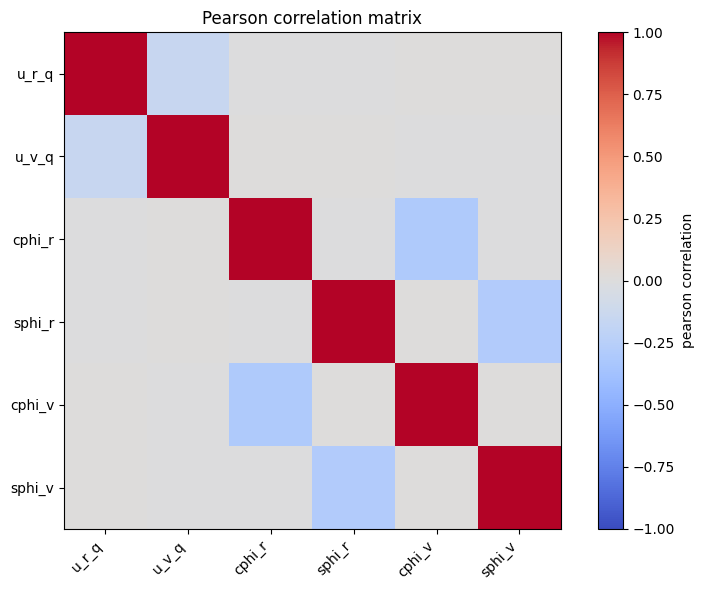

In [10]:
corr_cols = [
    "u_r_q",
    "u_v_q",
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

ge.plot_correlation_matrix(
    df_all_splits,
    corr_cols,
    method="pearson",
)

plt.show()

## Training with GEEANNT Package

### Model v 0.6.0 CVAE_CatEnergy_CatUV without adaptive training

In [ ]:
# Optional but recommended
ge.initialize_environment(seed=42, cpu_only=True, quiet=True)

n_types = int(cond_train.shape[1])

model = ge.CVAE_CatEnergy_CatUV(
    n_types=n_types,
    n_energy_bins=n_energy_bins,
    n_uv_bins=U_V_NBINS_EFF,
    uv_bin_edges=u_v_bins,

    latent_dim=8,
    hidden=(128, 128, 64, 64, 64),
    beta=0.1,
    type_weights=type_weights,

    min_log_sigma=-6.0,
    max_log_sigma=1.5,

    lambda_sigma=2e-3,
    sigma_target=-2.5,
    lambda_phi=2e-2,
    lambda_phi_r=2e-2,

    w_energy=0.8,
    w_sr=1.1,
    w_uv=1.1,
    w_phi_r=1.4,
    w_phi_v=1.1,
    w_ur=0.01,

    w_xy=0.005,
    w_vxy=0.025,

    phi_v_ang_weight=1.0,
    phi_v_mse_weight=0.6,

    sphere_R=R,
    sample_uv_uniform_inside_bin=True,
)

ge.compile_model(model, learning_rate=2e-4)

callbacks = ge.build_default_callbacks(
    monitor="val_loss",
    early_patience=8,
    lr_patience=6,
    factor=0.5,
    min_lr=1e-5,
    verbose=1,
)

ge.print_model_structure(model)


===== GEEANNT MODEL STRUCTURE =====
latent_dim = 8
n_types = 2
n_energy_bins = 512
n_uv_bins = 128

--- Encoder ---


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_2       │ (None, 647)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_28 (Dense)    │ (None, 128)       │     82,944 │ input_layer_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_26      │ (None, 128)       │          0 │ dense_28[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_29 (Dense)    │ (None, 128)       │     16,512 │ leaky_re_lu_26[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_27      │ (None, 128)       │          0 │ dense_29[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_30 (Dense)    │ (None, 64)        │      8,256 │ leaky_re_lu_27[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_28      │ (None, 64)        │          0 │ dense_30[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_31 (Dense)    │ (None, 64)        │      4,160 │ leaky_re_lu_28[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_29      │ (None, 64)        │          0 │ dense_31[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_32 (Dense)    │ (None, 64)        │      4,160 │ leaky_re_lu_29[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_30      │ (None, 64)        │          0 │ dense_32[0][0]    │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 8)         │        520 │ leaky_re_lu_30[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_logvar (Dense)    │ (None, 8)         │        520 │ leaky_re_lu_30[0… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 117,072 (457.31 KB)

 Trainable params: 117,072 (457.31 KB)

 Non-trainable params: 0 (0.00 B)


--- Shared decoder backbone ---


Model: "decoder_backbone"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_31 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_32 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 64)             │         4,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_33 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_36 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_34 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_35 (LeakyReLU)      │ (None, 128)            │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,856 (132.25 KB)

 Trainable params: 33,856 (132.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Energy branch ---


Model: "energy_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_38 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_36 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_37 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- Position branch ---


Model: "position_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_38 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_39 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_40 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- Direction branch ---


Model: "direction_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_43 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_41 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_44 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_42 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_43 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- s_r head ---


Model: "sr_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_46 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_44 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_45 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- u_v head ---


Model: "uv_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_48 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_46 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_49 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_47 (LeakyReLU)      │ ?                      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- phi_r head ---


Model: "phi_r_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_50 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_48 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_51 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_49 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_52 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)


--- phi_v head ---


Model: "phi_v_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_53 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_50 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_54 (Dense)                │ ?                      │   0 (unbuilt) │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_51 (LeakyReLU)      │ ?                      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_55 (Dense)                │ ?                      │   0 (unbuilt) │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 0 (0.00 B)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 0 (0.00 B)

In [ ]:
history = ge.fit_model(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=60,
    callbacks=callbacks,
    verbose=1,
)

Epoch 1/80
320/320 ━━━━━━━━━━━━━━━━━━━━ 35s 109ms/step - energy_ce: 5.7508 - kl: 4.6937 - loss: 2.2800 - nll: 11.3190 - phi_r_mse: 0.0245 - phi_r_reg: 2.8249e-04 - phi_reg: 7.5220e-04 - phi_v_ang: 0.2413 - phi_v_loss: 0.5309 - phi_v_mse: 0.4827 - rec: 1.7991 - sigma_reg: 0.0106 - sr_nll: 0.1309 - u_r_mse: 0.6792 - uv_ce: 4.7774 - vxy_mse: 0.3733 - xy_mse: 136.9374 - val_energy_ce: 5.7504 - val_kl: 4.7233 - val_loss: 2.2778 - val_nll: 11.2807 - val_phi_r_mse: 0.0240 - val_phi_r_reg: 2.5225e-04 - val_phi_reg: 7.1709e-04 - val_phi_v_ang: 0.2338 - val_phi_v_loss: 0.5144 - val_phi_v_mse: 0.4676 - val_rec: 1.7940 - val_sigma_reg: 0.0104 - val_sr_nll: 0.1193 - val_u_r_mse: 0.6694 - val_uv_ce: 4.7747 - val_vxy_mse: 0.3633 - val_xy_mse: 136.3648 - learning_rate: 2.0000e-04
Epoch 2/80
320/320 ━━━━━━━━━━━━━━━━━━━━ 34s 105ms/step - energy_ce: 5.7504 - kl: 4.7177 - loss: 2.2705 - nll: 11.2497 - phi_r_mse: 0.0237 - phi_r_reg: 2.3863e-04 - phi_reg: 6.4940e-04 - phi_v_ang: 0.2317 - phi_v_loss: 0.5098 


Available history keys:
['energy_ce', 'kl', 'loss', 'nll', 'phi_r_mse', 'phi_r_reg', 'phi_reg', 'phi_v_ang', 'phi_v_loss', 'phi_v_mse', 'rec', 'sigma_reg', 'sr_nll', 'u_r_mse', 'uv_ce', 'val_energy_ce', 'val_kl', 'val_loss', 'val_nll', 'val_phi_r_mse', 'val_phi_r_reg', 'val_phi_reg', 'val_phi_v_ang', 'val_phi_v_loss', 'val_phi_v_mse', 'val_rec', 'val_sigma_reg', 'val_sr_nll', 'val_u_r_mse', 'val_uv_ce', 'val_vxy_mse', 'val_xy_mse', 'vxy_mse', 'xy_mse', 'learning_rate']


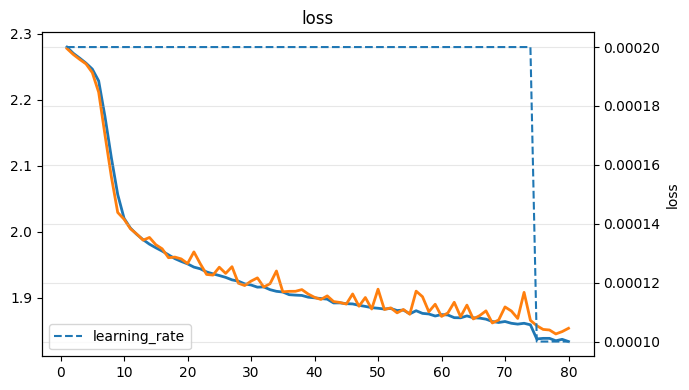

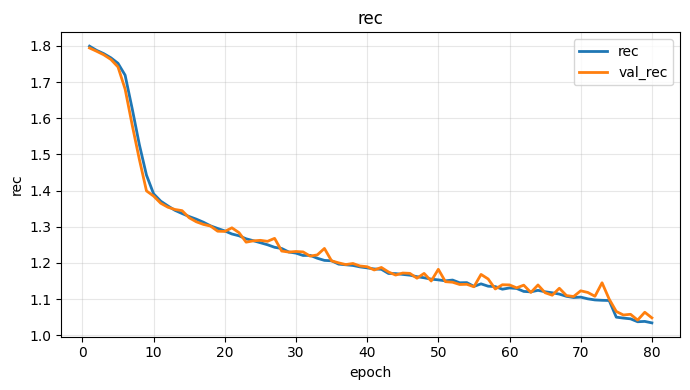

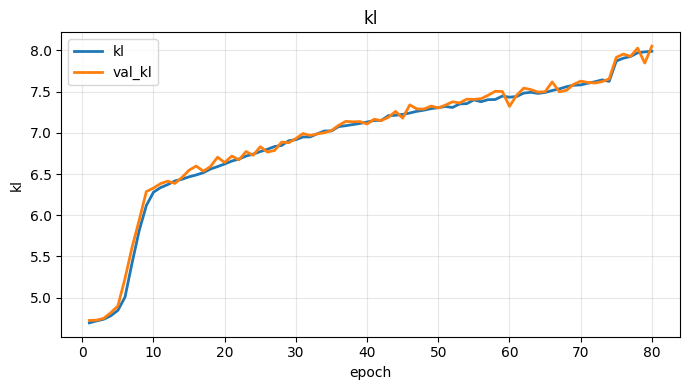

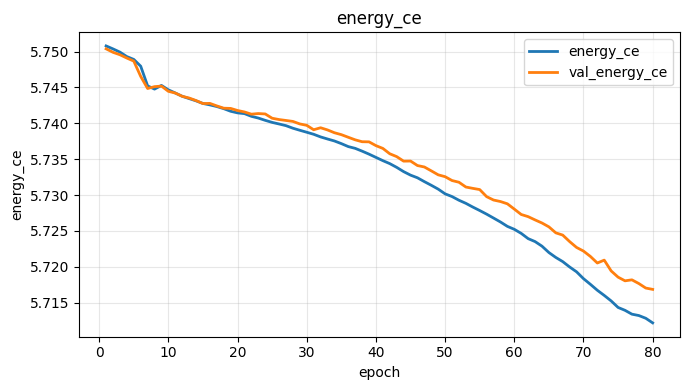

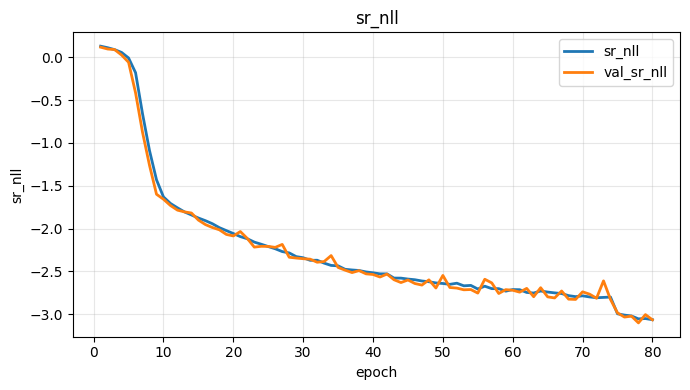

...

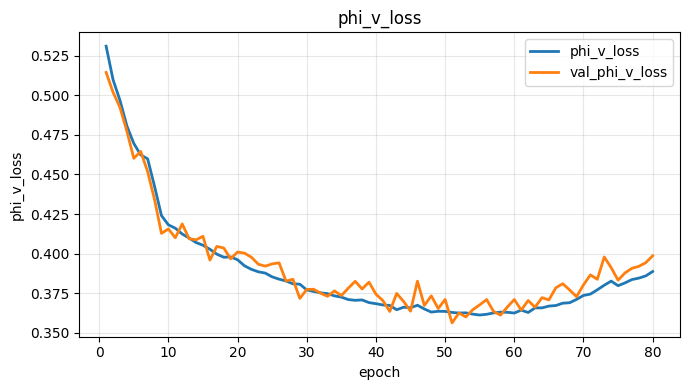

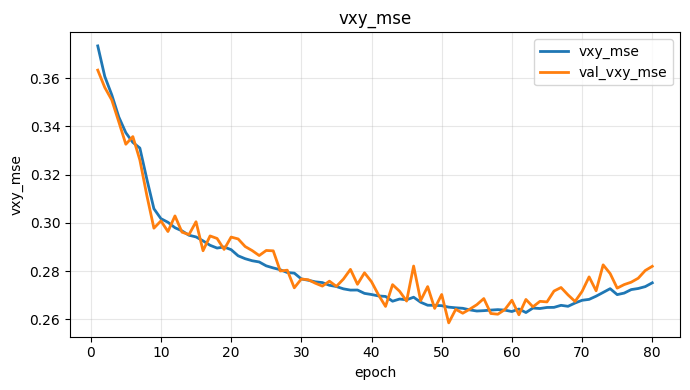

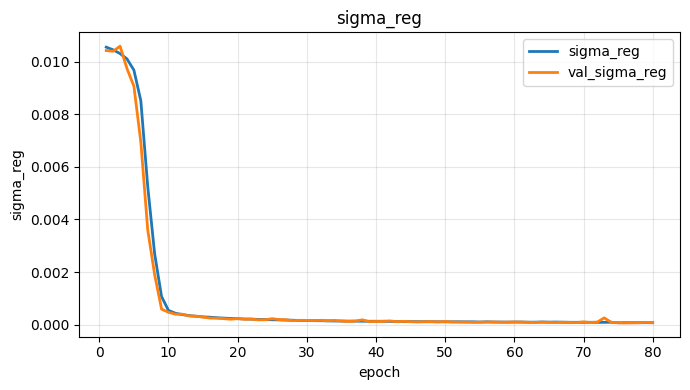

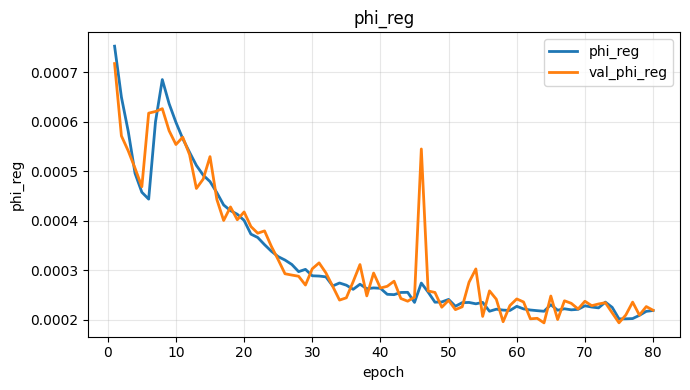

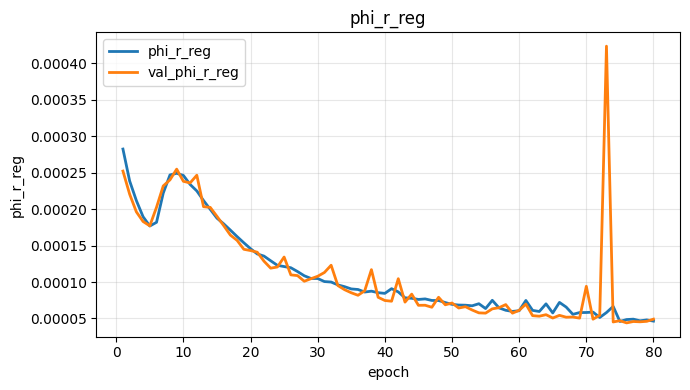

In [18]:
ge.plot_history(history)

### Model v 0.6.1 CVAE_CatEnergy_CatUV_TaskAdaptive

In [12]:
# ==========================================================
# Configuration for later saving and reference
# ==========================================================


model_config = {
    "model_class": "CVAE_CatEnergy_CatUV_TaskAdaptive",
    "n_types": n_types,
    "n_energy_bins": n_energy_bins,
    "n_uv_bins": U_V_NBINS_EFF,
    "latent_dim": 8,
    "hidden": [128, 128, 64, 64, 64],
    "beta": 0.1,
    "w_energy": 0.8,
    "w_sr": 1.1,
    "w_uv": 1.1,
    "w_phi_r": 1.4,
    "w_phi_v": 1.1,
    "w_xy": 0.005,
    "w_vxy": 0.025,
    "w_ur": 0.01,
    "sphere_R": R,
}

preprocessing_metadata = {
    "s_r_mean": s_r_mean,
    "s_r_std": s_r_std,
    "energy_bins": energy_bins,
    "u_v_bins": u_v_bins,
    "u_v_centers": u_v_centers,
    "type_probs": type_probs,
    "idx_to_type": idx_to_type,
    "n_types": n_types,
    "energy_binning_mode": feature_pack["energy_config"]["mode"],
}


In [16]:
# Optional but recommended
ge.initialize_environment(seed=42, cpu_only=True, quiet=True)

n_types = int(cond_train.shape[1])

model = ge.CVAE_CatEnergy_CatUV_TaskAdaptive(
    n_types=n_types,
    n_energy_bins=n_energy_bins,
    n_uv_bins=U_V_NBINS_EFF,
    uv_bin_edges=u_v_bins,

    latent_dim=model_config["latent_dim"],
    hidden=model_config["hidden"],
    beta=model_config["beta"],
    type_weights=type_weights,

    min_log_sigma=-6.0,
    max_log_sigma=1.5,

    lambda_sigma=2e-3,
    sigma_target=-2.5,
    lambda_phi=2e-2,
    lambda_phi_r=2e-2,

    w_energy=model_config["w_energy"],
    w_sr=model_config["w_sr"],
    w_uv=model_config["w_uv"],
    w_phi_r=model_config["w_phi_r"],
    w_phi_v=model_config["w_phi_v"],
    w_ur=model_config["w_ur"],

    w_xy=model_config["w_xy"],
    w_vxy=model_config["w_vxy"],

    phi_v_ang_weight=1.0,
    phi_v_mse_weight=0.6,

    sphere_R=R,
    sample_uv_uniform_inside_bin=True,
)

ge.compile_model(model, learning_rate=2e-4)

#! Adaptive Callback Configuration

energy_dist_cb = ge.ValidationEnergyDistributionMonitor(
    E_val_raw=E_val_raw,
    energy_bins=energy_bins,
    type_probs=type_probs,
    n_types=n_types,
    n_samples=n_energy_bins * 1000, # large number of samples for stable distribution estimation
    energy_mode="uniform",
    min_real_count=250,
    seed=42,
    every_n_epochs=1,
    verbose=1,
)

adaptive_cb = ge.TaskAdaptiveLossScheduler(
    task_configs={
        "energy": {
            "monitor": "val_energy_quality_score",
            "threshold": 1,
            "patience": 5,
            "min_delta": 0.005,
            "decay_factor": 0.8,
            "min_weight": 0.05,
            "cooldown": 1,
        }
    },
    verbose=1,
)

monitor_cb = ge.TaskAdaptiveTrainingMonitor(
    scheduler=adaptive_cb,
    metrics_to_show=[
        "loss",
        "val_loss",

        "energy_ce",
        "val_energy_ce",
        "val_energy_mean_rel_err",
        "val_energy_max_rel_err",
        "val_energy_p90_rel_err",
        "val_energy_quality_score",
        "val_energy_wdist",

        "uv_ce",
        "val_uv_ce",
        "phi_v_loss",
        "val_phi_v_loss",
        "xy_mse",
        "val_xy_mse",
        "vxy_mse",
        "val_vxy_mse",
    ],
    show_task_weights=True,
    show_scheduler_state=True,
    every_n_epochs=1,
)

callbacks = ge.build_default_callbacks(
    monitor="val_loss",
    early_patience=8,
    lr_patience=6,
    factor=0.5,
    min_lr=1e-5,
    verbose=1,
)

callbacks.append(energy_dist_cb)
callbacks.append(adaptive_cb)
callbacks.append(monitor_cb)


# DUMMY BUILD FOR STRUCTURE INSPECTION
dummy_z = tf.zeros((1, model.latent_dim), dtype=tf.float32)
dummy_cond = tf.zeros((1, n_types), dtype=tf.float32)
_ = model.decode(dummy_z, dummy_cond)

ge.print_model_tree_with_params(model)
#ge.print_model_structure(model)
ge.print_duplicate_trainable_variables(model)


===== GEEANNT MODEL TREE (WITH PARAMS) =====
CVAE_CatEnergy_CatUV_TaskAdaptive
│
├── Encoder [trainable] (total=84304, trainable=84304, non_trainable=0)
│   ├── input: [y_cont, E_onehot, uv_onehot, cond]
│   ├── z_mean
│   └── z_logvar
│
├── Decoder stem [trainable] (total=704, trainable=704, non_trainable=0)
│   └── light shared representation
│
├── Energy branch (short path) [trainable] (total=5472, trainable=5472, non_trainable=0)
│   └── energy_logits_head [trainable] (total=12544, trainable=12544, non_trainable=0)
│
├── Decoder deep trunk [trainable] (total=33088, trainable=33088, non_trainable=0)
│   └── deep shared representation
│   ├── Position branch [trainable] (total=33088, trainable=33088, non_trainable=0)
│   │   ├── sr_head [trainable] (total=16576, trainable=16576, non_trainable=0)
│   │   │   ├── sr_mu_head [trainable] (total=65, trainable=65, non_trainable=0)
│   │   │   └── sr_logsigma_head [trainable] (total=65, trainable=65, non_trainable=0)
│   │   └── phi_r_head

In [14]:
ge.print_model_structure(model)


===== GEEANNT MODEL STRUCTURE =====
Model class   = CVAE_CatEnergy_CatUV_TaskAdaptive
latent_dim    = 8
n_types       = 2
n_energy_bins = 256
n_uv_bins     = 128

--- Encoder ---


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 391)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     50,176 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128)       │          0 │ dense[0][0]       │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 128)       │     16,512 │ leaky_re_lu[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 128)       │          0 │ dense_1[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │      8,256 │ leaky_re_lu_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 64)        │          0 │ dense_2[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 64)        │      4,160 │ leaky_re_lu_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 64)        │          0 │ dense_3[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 64)        │      4,160 │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 64)        │          0 │ dense_4[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 8)         │        520 │ leaky_re_lu_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_logvar (Dense)    │ (None, 8)         │        520 │ leaky_re_lu_4[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 84,304 (329.31 KB)

 Trainable params: 84,304 (329.31 KB)

 Non-trainable params: 0 (0.00 B)


--- Decoder stem ---


Model: "decoder_stem"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 704 (2.75 KB)

 Trainable params: 704 (2.75 KB)

 Non-trainable params: 0 (0.00 B)


--- Decoder deep trunk ---


Model: "decoder_deep_trunk"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Energy branch ---


Model: "energy_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 48)             │         3,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 48)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 48)             │         2,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 48)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,472 (21.38 KB)

 Trainable params: 5,472 (21.38 KB)

 Non-trainable params: 0 (0.00 B)


--- Position branch ---


Model: "position_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_11 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_11 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_12 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_13 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Direction branch ---


Model: "direction_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_14 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- s_r head ---


Model: "sr_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_17 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,576 (64.75 KB)

 Trainable params: 16,576 (64.75 KB)

 Non-trainable params: 0 (0.00 B)


--- u_v head ---


Model: "uv_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_19 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,576 (64.75 KB)

 Trainable params: 16,576 (64.75 KB)

 Non-trainable params: 0 (0.00 B)


--- phi_r head ---


Model: "phi_r_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,706 (65.26 KB)

 Trainable params: 16,706 (65.26 KB)

 Non-trainable params: 0 (0.00 B)


--- phi_v head ---


Model: "phi_v_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,706 (65.26 KB)

 Trainable params: 16,706 (65.26 KB)

 Non-trainable params: 0 (0.00 B)


--- energy_logits_head ---
<Dense name=energy_logits, built=True>

--- sr_mu_head ---
<Dense name=sr_mu, built=True>

--- sr_logsigma_head ---
<Dense name=sr_logsigma, built=True>

--- uv_logits_head ---
<Dense name=uv_logits, built=True>

--- Task / loss weights ---
  energy : 0.8
      sr : 1.1
      uv : 1.1
   phi_r : 1.4
   phi_v : 1.1
      xy : 0.005
     vxy : 0.025
      ur : 0.01


In [15]:
history = ge.fit_model(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=40,
    callbacks=callbacks,
    verbose=1,
)

Epoch 1/40
320/320 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step - energy_ce: 5.3891 - kl: 1.0627 - loss: 9.8881 - nll: 61.0737 - phi_r_mse: 0.9297 - phi_r_reg: 0.0197 - phi_reg: 0.0198 - phi_v_ang: 0.8662 - phi_v_loss: 1.9056 - phi_v_mse: 1.7324 - rec: 9.7276 - sigma_reg: 0.0148 - sr_nll: 0.9665 - u_r_mse: 0.8290 - uv_ce: 4.8521 - vxy_mse: 1.2708 - xy_mse: 9384.8303
[ValidationEnergyDistributionMonitor] Epoch 1: mean_rel_err=0.098733, max_rel_err=0.447368, p90_rel_err=0.202084, quality_score=1.789474, valid_bins=174, val_energy_wdist=0.116726

[TrainingMonitor] Epoch 1
  lr = 2.000000e-04
  Metrics:
                loss : 6.586596
            val_loss : 3.309813
           energy_ce : 5.240944
       val_energy_ce : 5.079725
    val_energy_mean_rel_err : 0.098733
    val_energy_max_rel_err : 0.447368
    val_energy_p90_rel_err : 0.202084
    val_energy_quality_score : 1.789474
    val_energy_wdist : 0.116726
               uv_ce : 4.851911
           val_uv_ce : 4.851715
          phi_v_loss : 1.


Available history keys:
['energy_ce', 'kl', 'loss', 'nll', 'phi_r_mse', 'phi_r_reg', 'phi_reg', 'phi_v_ang', 'phi_v_loss', 'phi_v_mse', 'rec', 'sigma_reg', 'sr_nll', 'u_r_mse', 'uv_ce', 'val_energy_ce', 'val_kl', 'val_loss', 'val_nll', 'val_phi_r_mse', 'val_phi_r_reg', 'val_phi_reg', 'val_phi_v_ang', 'val_phi_v_loss', 'val_phi_v_mse', 'val_rec', 'val_sigma_reg', 'val_sr_nll', 'val_u_r_mse', 'val_uv_ce', 'val_vxy_mse', 'val_xy_mse', 'vxy_mse', 'xy_mse', 'learning_rate', 'val_energy_mean_rel_err', 'val_energy_max_rel_err', 'val_energy_p90_rel_err', 'val_energy_quality_score', 'val_energy_n_valid_bins', 'val_energy_valid_bin_fraction', 'val_energy_hist_err', 'val_energy_wdist']


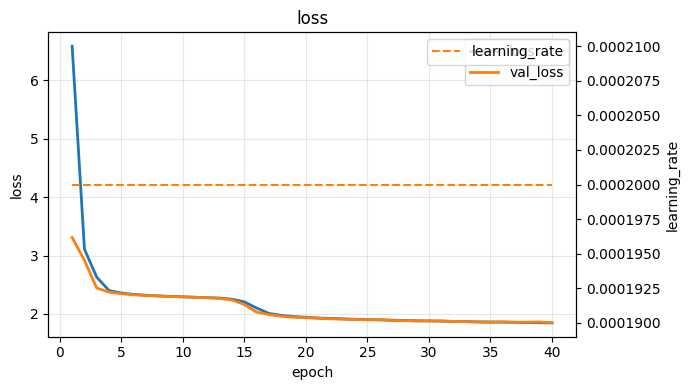

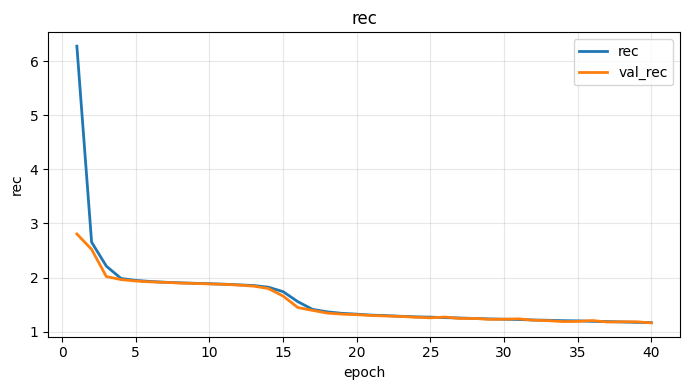

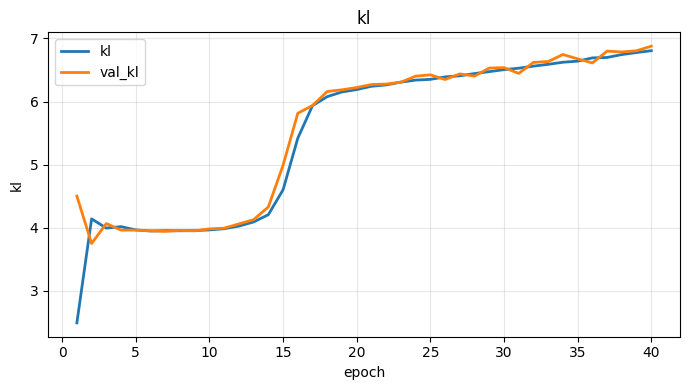

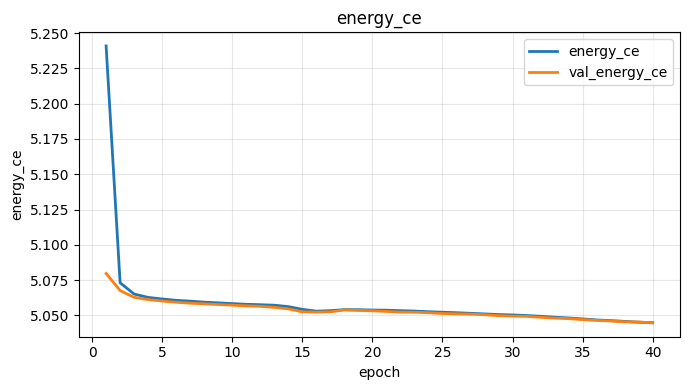

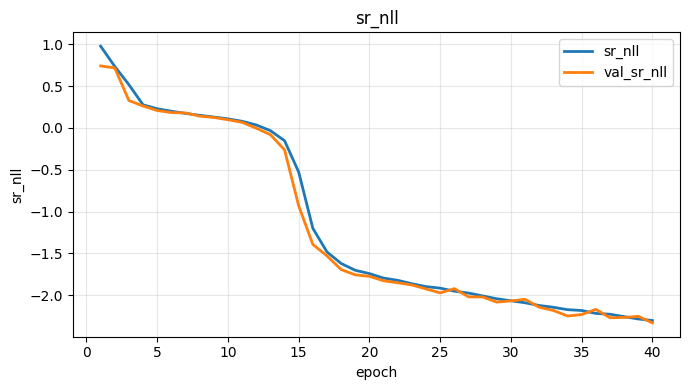

...

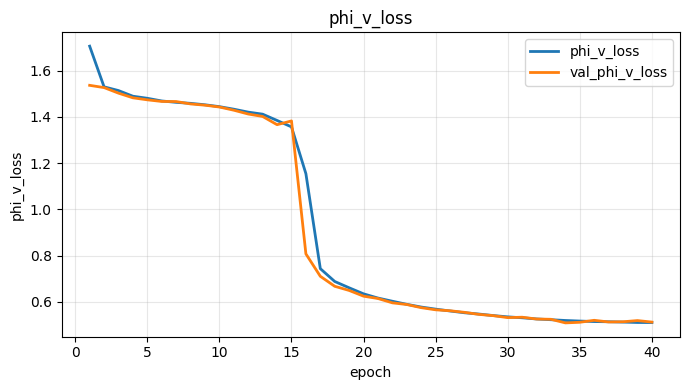

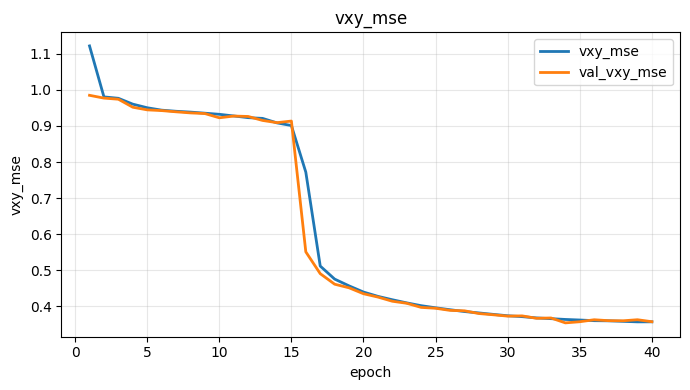

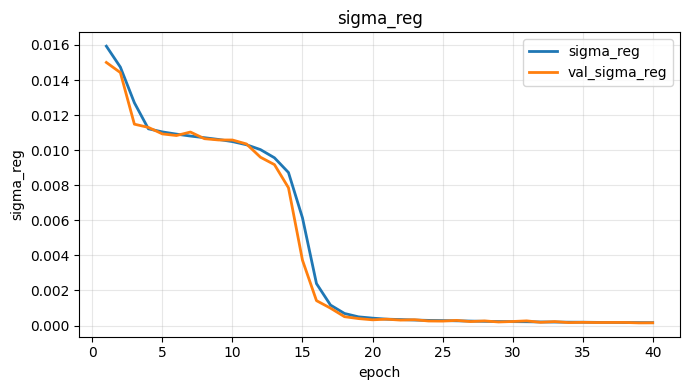

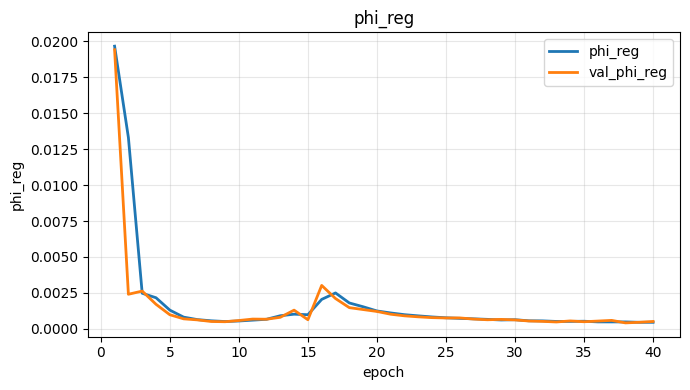

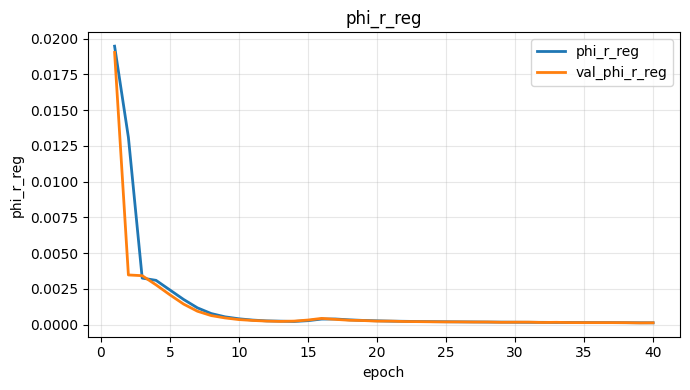

In [16]:
ge.plot_history(history)

In [22]:
checkpoint_info = ge.save_training_checkpoint(
    model=model,
    checkpoint_dir="checkpoints/task_adaptive_run_005",
    checkpoint_name="task_adaptive",
    epoch=40,
    history=history,
    model_config=model_config,
    preprocessing_metadata=preprocessing_metadata,
    training_metadata={
        "epochs_requested": 40,
        "learning_rate": 2e-4,
        "seed": 42,
    },
    callbacks=callbacks,
    notes="Checkpoint after task-adaptive energy training.",
)

### Model v 0.7.0 CVAE_CatEnergy_ContGeom_TaskAdaptive

In [73]:
# ==========================================================
# Configuration for later saving and reference - v0.7
# ==========================================================

model_config = {
    "model_class": "CVAE_CatEnergy_ContGeom_TaskAdaptive",
    "n_types": n_types,
    "n_energy_bins": n_energy_bins,
    "y_cont_dim": Y_CONT_DIM,

    "latent_dim": 8,
    "hidden": [128, 128, 64, 64, 64],
    "beta": 0.1,

    "w_energy": 0.8,
    "w_ur": 1.1,
    "w_uv": 1.1,
    "w_phi_r": 1.4,
    "w_phi_v": 1.1,

    "min_log_sigma": -6.0,
    "max_log_sigma": 1.5,
    "lambda_sigma": 2e-3,
    "sigma_target": -2.5,

    "lambda_phi": 2e-2,
    "lambda_phi_r": 2e-2,

    "energy_sampling_temperature": 1.0,

    "phi_v_mse_weight": 0.5,
    "phi_v_ang_weight": 1.2,

    "stem_width": 64,
    "deep_decoder_hidden": [128, 128, 64],
    "energy_branch_hidden": [48, 48],
}

preprocessing_metadata = {
    "geometry_transform": "quantile_u_r_u_v",
    "cont_cols": cont_cols,
    "y_cont_dim": Y_CONT_DIM,

    "energy_bins": energy_bins,
    "type_probs": type_probs,
    "idx_to_type": idx_to_type,
    "n_types": n_types,

    "energy_binning_mode": feature_pack["energy_config"]["mode"],
    "energy_config": feature_pack["energy_config"],

    "geometry_metadata": geometry_metadata,
}

In [56]:
# Optional but recommended
ge.initialize_environment(seed=42, cpu_only=True, quiet=True)

n_types = int(cond_train.shape[1])

model = ge.CVAE_CatEnergy_ContGeom_TaskAdaptive(
    n_types=n_types,
    n_energy_bins=n_energy_bins,
    y_cont_dim=Y_CONT_DIM,

    latent_dim=model_config["latent_dim"],
    hidden=model_config["hidden"],
    beta=model_config["beta"],
    type_weights=type_weights,

    min_log_sigma=model_config["min_log_sigma"],
    max_log_sigma=model_config["max_log_sigma"],

    lambda_sigma=model_config["lambda_sigma"],
    sigma_target=model_config["sigma_target"],

    lambda_phi=model_config["lambda_phi"],
    lambda_phi_r=model_config["lambda_phi_r"],

    w_energy=model_config["w_energy"],
    w_ur=model_config["w_ur"],
    w_uv=model_config["w_uv"],
    w_phi_r=model_config["w_phi_r"],
    w_phi_v=model_config["w_phi_v"],

    energy_sampling_temperature=model_config["energy_sampling_temperature"],

    phi_v_ang_weight=model_config["phi_v_ang_weight"],
    phi_v_mse_weight=model_config["phi_v_mse_weight"],

    stem_width=model_config["stem_width"],
    deep_decoder_hidden=model_config["deep_decoder_hidden"],
    energy_branch_hidden=model_config["energy_branch_hidden"],
)

ge.compile_model(
    model,
    learning_rate=2e-4,
)

#! Adaptive Callback Configuration

energy_dist_cb = ge.ValidationEnergyDistributionMonitor(
    E_val_raw=E_val_raw,
    energy_bins=energy_bins,
    type_probs=type_probs,
    n_types=n_types,
    n_samples=n_energy_bins * 1000, # large number of samples for stable distribution estimation
    energy_mode="uniform",
    min_real_count=250,
    seed=42,
    every_n_epochs=1,
    verbose=1,
)

adaptive_cb = ge.TaskAdaptiveLossScheduler(
    task_configs={
        "energy": {
            "monitor": "val_energy_quality_score",
            "threshold": 1,
            "patience": 5,
            "min_delta": 0.005,
            "decay_factor": 0.8,
            "min_weight": 0.05,
            "cooldown": 1,
        }
    },
    verbose=1,
)

monitor_cb = ge.TaskAdaptiveTrainingMonitor(
    scheduler=adaptive_cb,
    metrics_to_show=[
        "loss",
        "val_loss",

        "energy_ce",
        "val_energy_ce",

        "ur_nll",
        "val_ur_nll",

        "uv_nll",
        "val_uv_nll",

        "phi_r_mse",
        "val_phi_r_mse",

        "phi_v_mse",
        "val_phi_v_mse",

        "phi_v_ang",
        "val_phi_v_ang",

        "val_energy_mean_rel_err",
        "val_energy_max_rel_err",
        "val_energy_p90_rel_err",
        "val_energy_quality_score",
        "val_energy_wdist",
    ],
    show_task_weights=True,
    show_scheduler_state=True,
    every_n_epochs=1,
)

callbacks = ge.build_default_callbacks(
    monitor="val_loss",
    early_patience=8,
    lr_patience=6,
    factor=0.5,
    min_lr=1e-5,
    verbose=1,
)

callbacks.append(energy_dist_cb)
callbacks.append(adaptive_cb)
callbacks.append(monitor_cb)


# DUMMY BUILD FOR STRUCTURE INSPECTION
dummy_z = tf.zeros((1, model.latent_dim), dtype=tf.float32)
dummy_cond = tf.zeros((1, n_types), dtype=tf.float32)
_ = model.decode(dummy_z, dummy_cond)

ge.print_model_tree_with_params(model)
#ge.print_model_structure(model)
ge.print_duplicate_trainable_variables(model)


===== GEEANNT MODEL TREE (WITH PARAMS) =====
CVAE_CatEnergy_ContGeom_TaskAdaptive
│
├── Encoder [trainable] (total=68176, trainable=68176, non_trainable=0)
│   ├── input: [y_cont, E_onehot, cond]
│   ├── z_mean
│   └── z_logvar
│
├── Decoder stem [trainable] (total=768, trainable=768, non_trainable=0)
│   └── light shared representation
│
├── Energy branch (short path) [trainable] (total=5472, trainable=5472, non_trainable=0)
│   └── energy_logits_head [trainable] (total=12544, trainable=12544, non_trainable=0)
│
├── Decoder deep trunk [trainable] (total=33088, trainable=33088, non_trainable=0)
│   └── deep shared representation
│   ├── Position branch [trainable] (total=33088, trainable=33088, non_trainable=0)
│   │   ├── ur_head [trainable] (total=16576, trainable=16576, non_trainable=0)
│   │   │   ├── ur_mu_head [trainable] (total=65, trainable=65, non_trainable=0)
│   │   │   └── ur_logsigma_head [trainable] (total=65, trainable=65, non_trainable=0)
│   │   └── phi_r_head [traina

In [16]:
ge.print_model_structure(model)


===== GEEANNT MODEL STRUCTURE =====
Model class   = CVAE_CatEnergy_ContGeom_TaskAdaptive
latent_dim    = 8
n_types       = 2
n_energy_bins = 256
y_cont_dim    = 6

--- Encoder ---


Model: "encoder"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 264)       │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 128)       │     33,920 │ input_layer[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu         │ (None, 128)       │          0 │ dense[0][0]       │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_1 (Dense)     │ (None, 128)       │     16,512 │ leaky_re_lu[0][0] │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_1       │ (None, 128)       │          0 │ dense_1[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_2 (Dense)     │ (None, 64)        │      8,256 │ leaky_re_lu_1[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_2       │ (None, 64)        │          0 │ dense_2[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_3 (Dense)     │ (None, 64)        │      4,160 │ leaky_re_lu_2[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_3       │ (None, 64)        │          0 │ dense_3[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense_4 (Dense)     │ (None, 64)        │      4,160 │ leaky_re_lu_3[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ leaky_re_lu_4       │ (None, 64)        │          0 │ dense_4[0][0]     │
│ (LeakyReLU)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_mean (Dense)      │ (None, 8)         │        520 │ leaky_re_lu_4[0]… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ z_logvar (Dense)    │ (None, 8)         │        520 │ leaky_re_lu_4[0]… │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 68,048 (265.81 KB)

 Trainable params: 68,048 (265.81 KB)

 Non-trainable params: 0 (0.00 B)


--- Decoder stem ---


Model: "decoder_stem"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)      │ (None, 10)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 64)             │           704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_5 (LeakyReLU)       │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 704 (2.75 KB)

 Trainable params: 704 (2.75 KB)

 Non-trainable params: 0 (0.00 B)


--- Decoder deep trunk ---


Model: "decoder_deep_trunk"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_6 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_7 (Dense)                 │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_7 (LeakyReLU)       │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_8 (LeakyReLU)       │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Energy branch ---


Model: "energy_branch"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_3 (InputLayer)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 48)             │         3,120 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_9 (LeakyReLU)       │ (None, 48)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_10 (Dense)                │ (None, 48)             │         2,352 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_10 (LeakyReLU)      │ (None, 48)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,472 (21.38 KB)

 Trainable params: 5,472 (21.38 KB)

 Non-trainable params: 0 (0.00 B)


--- Position branch ---


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_11 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_11 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_12 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_13 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_13 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- Direction branch ---


Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_14 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_14 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 128)            │        16,512 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_15 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_16 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 33,088 (129.25 KB)

 Trainable params: 33,088 (129.25 KB)

 Non-trainable params: 0 (0.00 B)


--- u_v head ---


Model: "uv_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_19 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_19 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_20 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,576 (64.75 KB)

 Trainable params: 16,576 (64.75 KB)

 Non-trainable params: 0 (0.00 B)


--- phi_r head ---


Model: "phi_r_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_21 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_21 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_22 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,706 (65.26 KB)

 Trainable params: 16,706 (65.26 KB)

 Non-trainable params: 0 (0.00 B)


--- phi_v head ---


Model: "phi_v_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_23 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_24 (LeakyReLU)      │ (None, 64)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 2)              │           130 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,706 (65.26 KB)

 Trainable params: 16,706 (65.26 KB)

 Non-trainable params: 0 (0.00 B)


--- u_r_q head ---


Model: "ur_head"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_17 (Dense)                │ (None, 128)            │         8,320 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_17 (LeakyReLU)      │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 64)             │         8,256 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ leaky_re_lu_18 (LeakyReLU)      │ (None, 64)             │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 16,576 (64.75 KB)

 Trainable params: 16,576 (64.75 KB)

 Non-trainable params: 0 (0.00 B)


--- ur_mu_head ---
<Dense name=ur_mu, built=True>

--- ur_logsigma_head ---
<Dense name=ur_logsigma, built=True>

--- uv_mu_head ---
<Dense name=uv_mu, built=True>

--- uv_logsigma_head ---
<Dense name=uv_logsigma, built=True>

--- energy_logits_head ---
<Dense name=energy_logits, built=True>

--- Task / loss weights ---
  energy : 0.2621440000000001
      ur : 1.1
      uv : 1.1
   phi_r : 1.4
   phi_v : 1.1


In [57]:
history = ge.fit_model(
    model=model,
    train_ds=train_ds,
    val_ds=val_ds,
    epochs=40,
    callbacks=callbacks,
    verbose=1,
)

Epoch 1/40
1507/1507 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step - energy_ce: 5.1742 - kl: 0.0343 - loss: 0.2796 - nll: 9.0858 - phi_r_mse: 1.1018 - phi_r_reg: 0.0138 - phi_reg: 0.0029 - phi_v_ang: 0.9372 - phi_v_loss: 2.0618 - phi_v_mse: 1.8743 - rec: 0.2374 - sigma_reg: 0.0221 - ur_nll: 0.5204 - uv_nll: 0.5123
[ValidationEnergyDistributionMonitor] Epoch 1: mean_rel_err=0.045047, max_rel_err=0.266447, p90_rel_err=0.082024, quality_score=1.065789, valid_bins=164, val_energy_wdist=0.005827

[TrainingMonitor] Epoch 1
  lr = 2.000000e-04
  Metrics:
                loss : 0.270119
            val_loss : 0.262394
           energy_ce : 5.072433
       val_energy_ce : 5.024861
              ur_nll : 0.521905
          val_ur_nll : 0.522100
              uv_nll : 0.513162
          val_uv_nll : 0.510660
           phi_r_mse : 1.114398
       val_phi_r_mse : 1.116556
           phi_v_mse : 1.681692
       val_phi_v_mse : 1.477542
           phi_v_ang : 0.840846
       val_phi_v_ang : 0.738771
    val_en


Available history keys:
['energy_ce', 'kl', 'loss', 'nll', 'phi_r_mse', 'phi_r_reg', 'phi_reg', 'phi_v_ang', 'phi_v_loss', 'phi_v_mse', 'rec', 'sigma_reg', 'ur_nll', 'uv_nll', 'val_energy_ce', 'val_kl', 'val_loss', 'val_nll', 'val_phi_r_mse', 'val_phi_r_reg', 'val_phi_reg', 'val_phi_v_ang', 'val_phi_v_loss', 'val_phi_v_mse', 'val_rec', 'val_sigma_reg', 'val_ur_nll', 'val_uv_nll', 'learning_rate', 'val_energy_mean_rel_err', 'val_energy_max_rel_err', 'val_energy_p90_rel_err', 'val_energy_quality_score', 'val_energy_n_valid_bins', 'val_energy_valid_bin_fraction', 'val_energy_hist_err', 'val_energy_wdist']


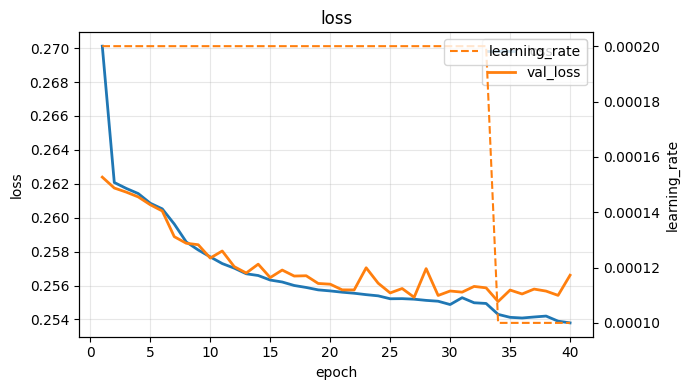

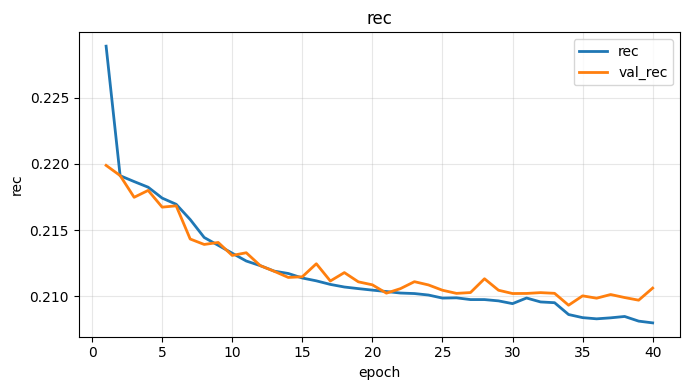

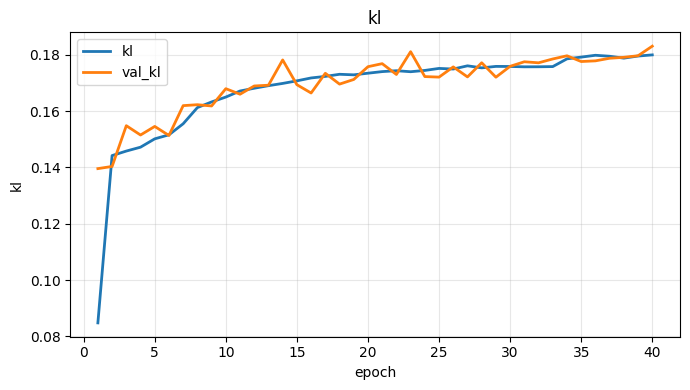

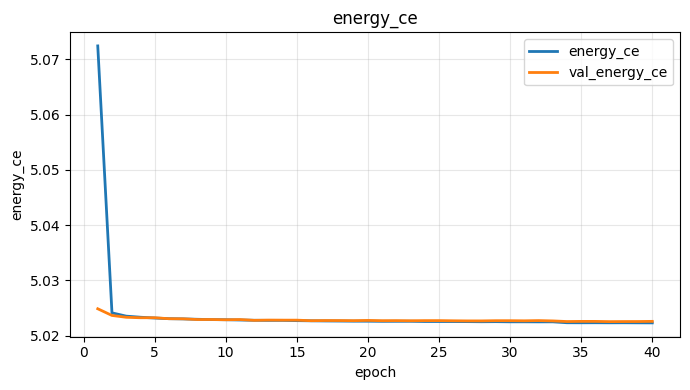

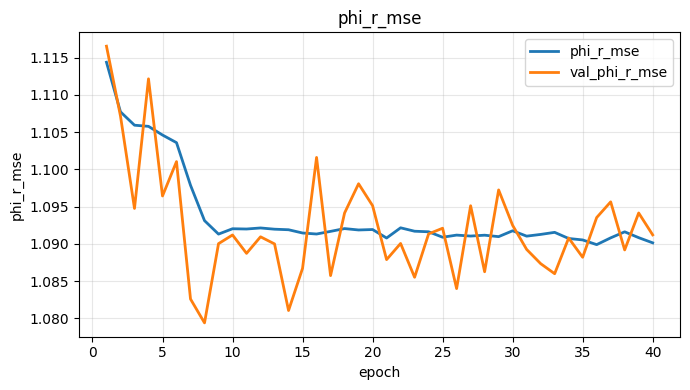

...

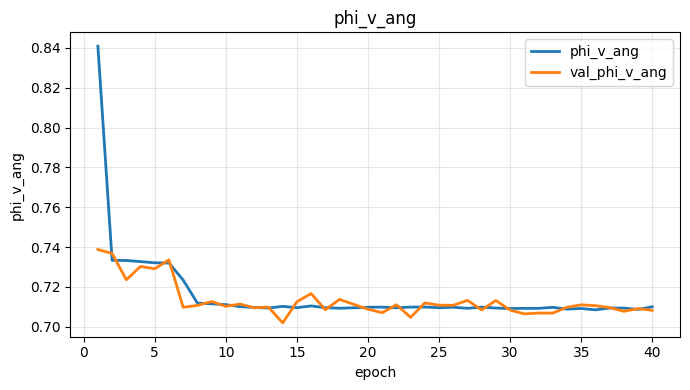

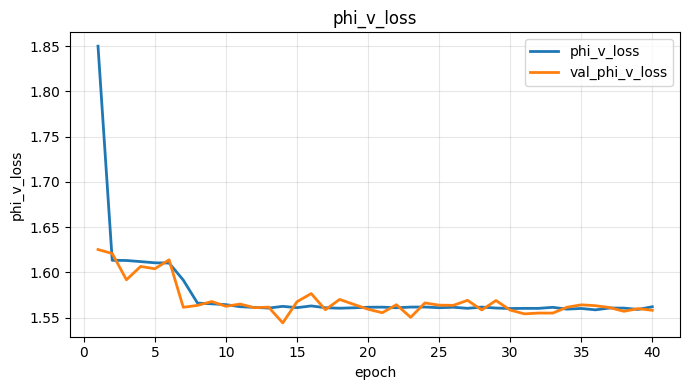

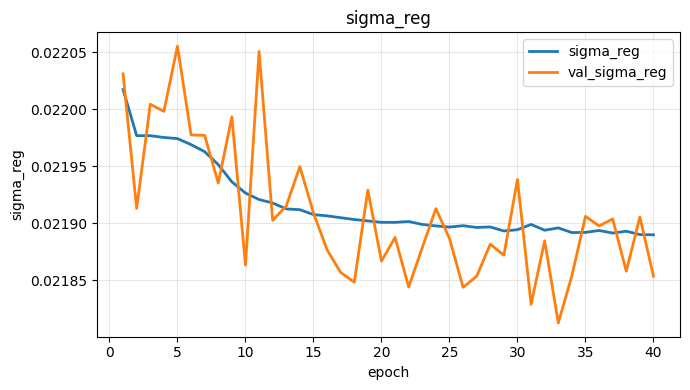

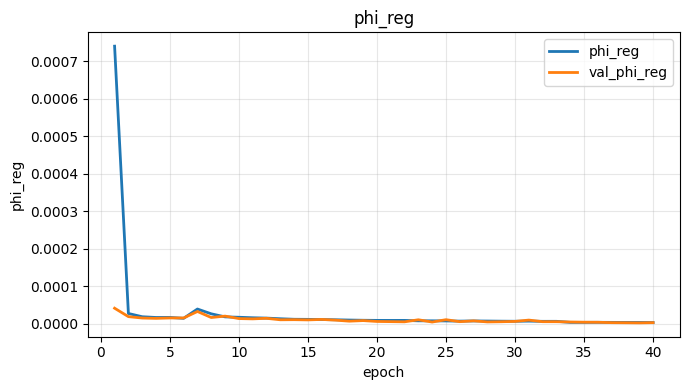

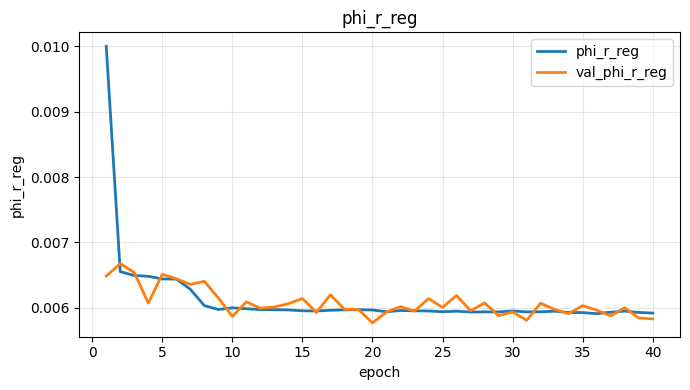

In [58]:
ge.plot_history(history)

## Generation and Validation

In [74]:
### SKIP MODEL TRAINING AND DIRECTLY LOAD A TRAINED MODEL FOR GENERATION AND EVALUATION

model_config = {
    "model_class": "CVAE_CatEnergy_ContGeom_TaskAdaptive",

    "n_types": n_types,
    "n_energy_bins": n_energy_bins,
    "y_cont_dim": Y_CONT_DIM,

    "latent_dim": 8,
    "hidden": [128, 128, 64, 64, 64],
    "beta": 0.1,

    "w_energy": 0.8,
    "w_ur": 1.1,
    "w_uv": 1.1,
    "w_phi_r": 1.4,
    "w_phi_v": 1.1,

    "min_log_sigma": -6.0,
    "max_log_sigma": 1.5,

    "lambda_sigma": 2e-3,
    "sigma_target": -2.5,

    "lambda_phi": 2e-2,
    "lambda_phi_r": 2e-2,

    "energy_sampling_temperature": 1.0,

    "phi_v_ang_weight": 1.0,
    "phi_v_mse_weight": 0.6,

    "stem_width": 64,
    "deep_decoder_hidden": [128, 128, 64],
    "energy_branch_hidden": [48, 48],
}

preprocessing_metadata = {
    "geometry_transform": "quantile_u_r_u_v",
    "cont_cols": cont_cols,
    "y_cont_dim": Y_CONT_DIM,

    "energy_bins": energy_bins,
    "type_probs": type_probs,
    "idx_to_type": idx_to_type,
    "n_types": n_types,

    "energy_binning_mode": feature_pack["energy_config"]["mode"],
    "energy_config": feature_pack["energy_config"],
    "geometry_metadata": geometry_metadata,
}

model = ge.load_task_adaptive_model_for_generation(
    save_dir="trained_models/task_adaptive_energy_cont_run_001",
    model_name="task_adaptive_cvae_energy_cont",
    model_config=model_config,
    energy_bins=energy_bins,
    u_v_bins=None,          # v0.7: not used
    n_types=n_types,
    type_weights=type_weights,
    radius=R,
    compile_model_fn=None,
    verbose=1,
)

Loaded task-adaptive model.
Model class: CVAE_CatEnergy_ContGeom_TaskAdaptive
Weights: trained_models/task_adaptive_energy_cont_run_001/task_adaptive_cvae_energy_cont.weights.h5
Task weights: trained_models/task_adaptive_energy_cont_run_001/task_adaptive_cvae_energy_cont_task_weights.json
Current task weights: {'energy': 0.2621440000000001, 'ur': 1.1, 'uv': 1.1, 'phi_r': 1.4, 'phi_v': 1.1}


In [75]:
NGEN = len(X_cont_test)
# NGEN = int(1e6)  # per test più stabile ma ancora leggero

gen_raw = ge.generate_latent_outputs(
    model=model,
    n_samples=NGEN,
    type_probs=type_probs,
    n_types=n_types,
    idx_to_type=idx_to_type,
)

gen_feat = ge.reconstruct_generated_features(
    gen_raw,
    energy_bins=energy_bins,
    energy_mode="uniform",
    qt_u_r=qt_u_r,
    qt_u_v=qt_u_v,
    geometry_mode="quantile_u_r_u_v",
)

gen_phys = ge.reconstruct_generated_physics(
    gen_feat,
    center=(0.0, 0.0, -507.66),
    radius=100.0,
)

real_phys = ge.reconstruct_real_test_physics(
    X_cont_test=X_cont_test,
    E_test_raw=E_test_raw,
    qt_u_r=qt_u_r,
    qt_u_v=qt_u_v,
    center=(0.0, 0.0, -507.66),
    radius=100.0,
    geometry_mode="quantile_u_r_u_v",
)

ge.report_generated_constraints(gen_phys, radius=100.0)

scores = ge.compute_wasserstein_scores(real_phys, gen_phys)
print(scores)

--- CONSTRAINT CHECKS ---

Sphere constraint:
r_gen: mean 100.00000001009424 std 2.4724842751159663e-06 min 99.99998864532637 max 100.00001205537727
mean |r-R| = 1.8779554442640706e-06

Direction norm:
||v||: mean 0.999999999998999 std 9.340169146919065e-16 min 0.9999999999989996 max 0.9999999999990002
mean ||v||-1| = 1.000047821163086e-12

Unit circle checks:
phi_r norm: mean 1.0 std 3.4096573e-08 min 0.9999999 max 1.0000001
phi_v norm: mean 1.0 std 3.893396e-08 min 0.9999998 max 1.0000001

Physical variables:
E_gen: min 0.050040174 max 0.79795706
u_r_gen min/max: -0.9997106984477897 0.9998955595017934
u_v_gen min/max: -0.9997857521630392 0.03879084904748988
fraction u_v_gen > 0: 0.02724502343485467

Quantile variables:
u_r_gen min/max: -0.9997106984477897 0.9998955595017934
u_v_gen min/max: -0.9997857521630392 0.03879084904748988
fraction |u_r| > 1: 0.0
fraction |u_v| > 1: 0.0
{'logE': 0.0010117401943324077, 'u_r': 0.051749122842927174, 'u_v': 0.012181225350188873, 'x': 2.61060810825

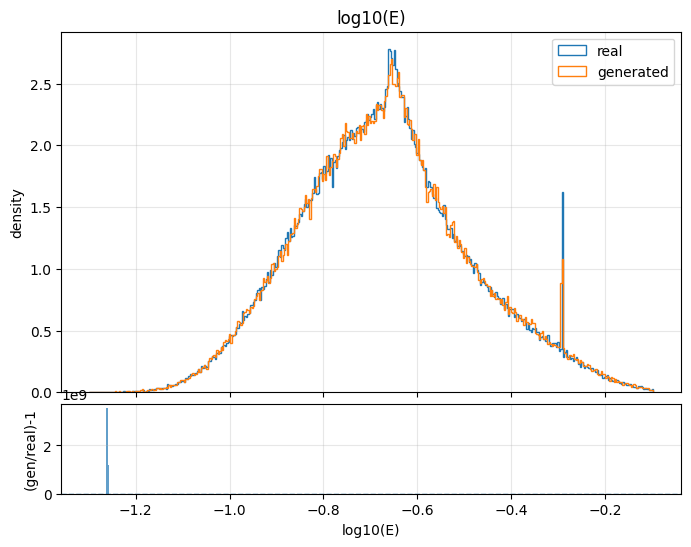

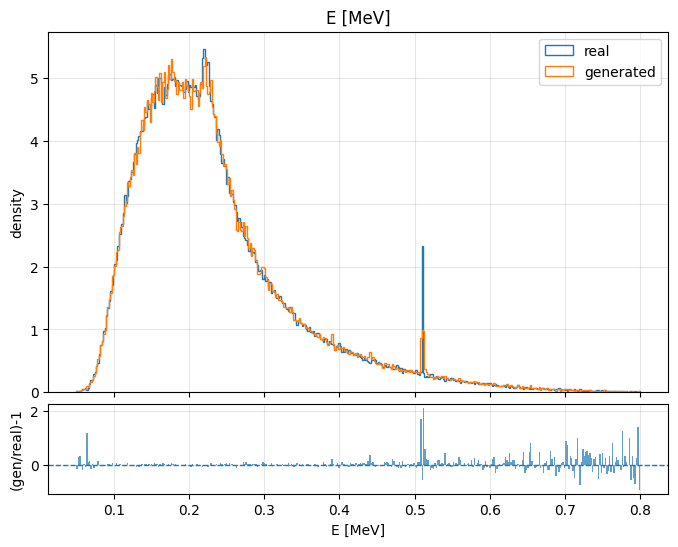

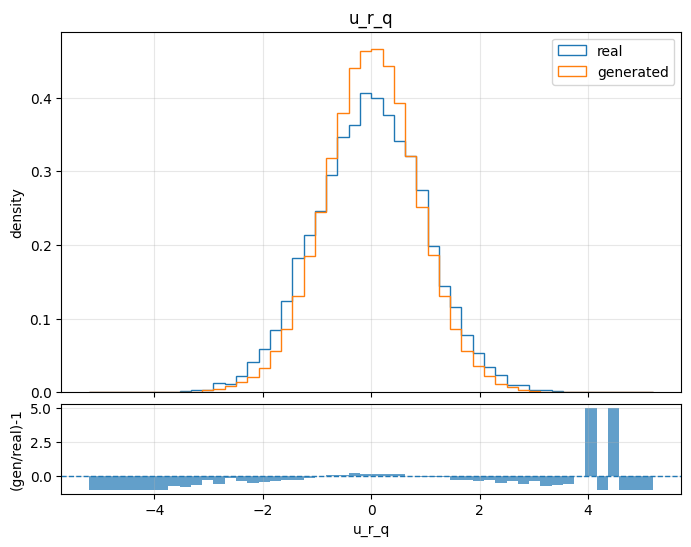

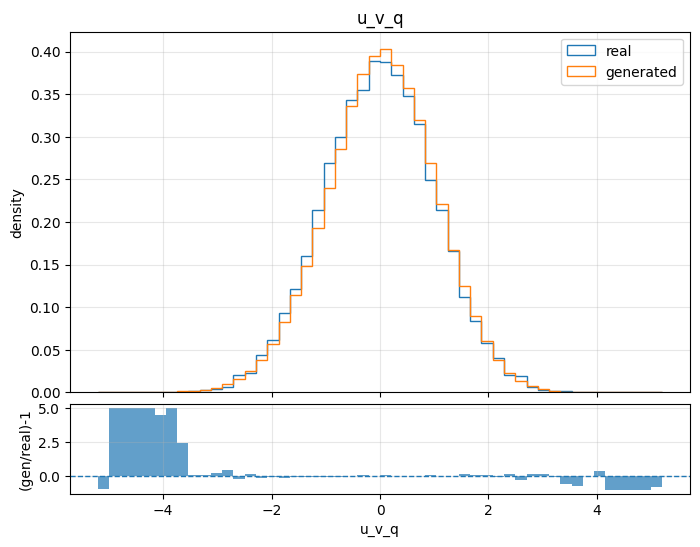

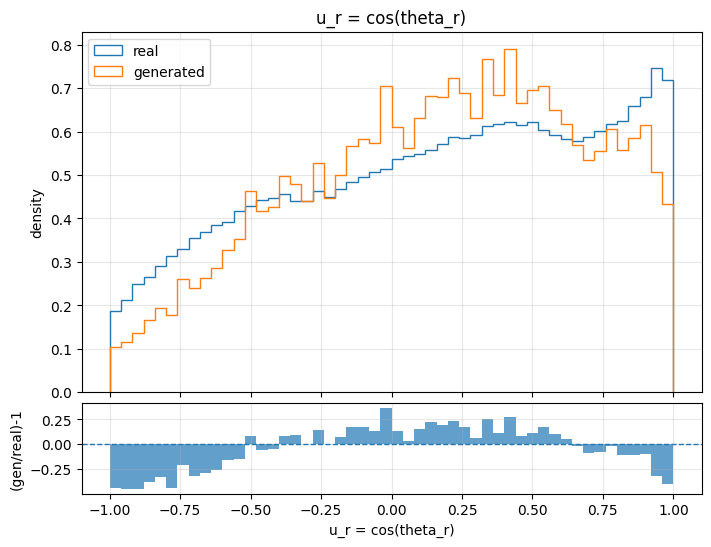

...

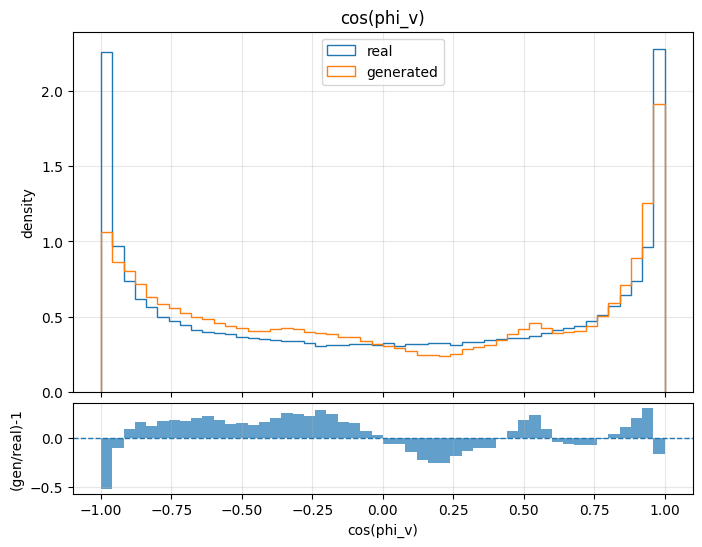

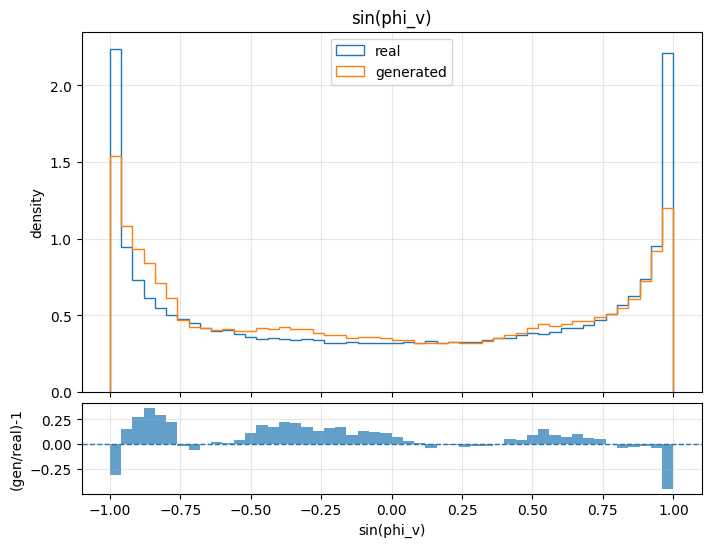

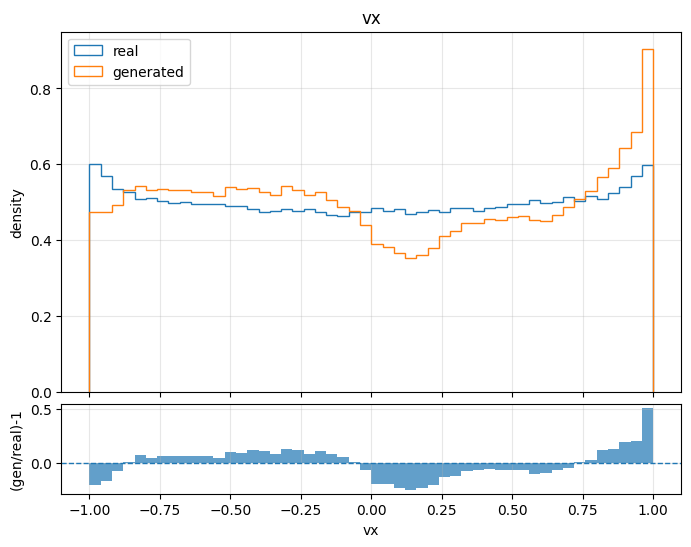

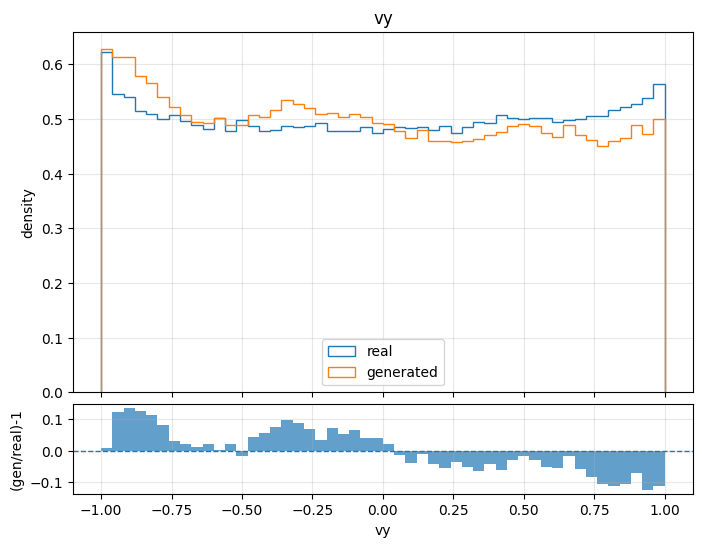

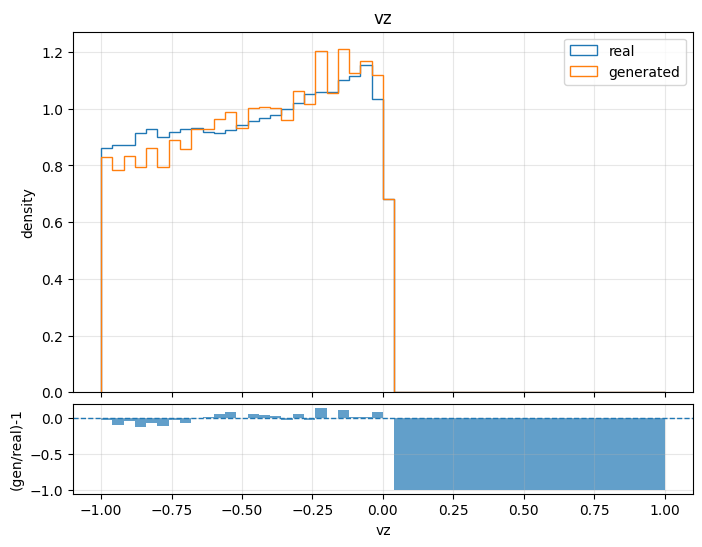


--- RANGE CHECK ---
logE real/gen: -1.2985218187136052 -0.0971983716800442 | -1.3006812 -0.09802048
u_v  real/gen: -0.9997856821547966 0.03879100034037341 | -0.9997857521630392 0.03879084904748988

Position:
x real/gen: -99.99881320471393 99.99969795329422 | -99.99985938613105 99.99991053236005
y real/gen: -99.99989126293066 99.9997426159025 | -99.99919387414893 99.99970024024256
z real/gen: -607.6529757247487 -407.67039759085736 | -607.631069844779 -407.6704440498207

Direction:
cphi_v real/gen: -1.0 1.0 | -1.2372508 1.1585553
sphi_v real/gen: -1.0 1.0 | -1.1118174 1.1754298
vx real/gen: -0.9999941147869101 0.9999922148952067 | -0.9999980965611014 0.9999997130246807
vy real/gen: -0.9999937896110749 0.9999844916382573 | -0.999998794801115 0.9999989040908203
vz real/gen: -0.9997856821547966 0.03879100034037341 | -0.9997857521846085 0.038790847290435776

--- COS/SIN NORM CHECK ---
phi_r real/gen: 1.0 0.7907892
phi_v real/gen: 1.0 1.0030802


In [76]:
ge.set_plot_theme("light")

# ==========================================================
# Energy
# ==========================================================

ge.compare_hist_with_residuals(
    real_phys["logE_real"],
    gen_phys["logE_gen"],
    "log10(E)",
    bins=400,
)

ge.compare_hist_with_residuals(
    real_phys["E_real"],
    gen_phys["E_gen"],
    "E [MeV]",
    bins=400,
)

# ==========================================================
# Quantile-space variables, model native space
# ==========================================================

ge.compare_hist_with_residuals(
    real_phys["u_r_q_real"],
    gen_phys["u_r_q_gen"],
    "u_r_q",
    ratio_clip=5,
    bins=50,
)

ge.compare_hist_with_residuals(
    real_phys["u_v_q_real"],
    gen_phys["u_v_q_gen"],
    "u_v_q",
    ratio_clip=5,
    bins=50,
)

# ==========================================================
# Physical spherical variables
# ==========================================================

ur_plot_range = (
    min(real_phys["u_r_real"].min(), gen_phys["u_r_gen"].min()),
    max(real_phys["u_r_real"].max(), gen_phys["u_r_gen"].max()),
)

uv_plot_range = (
    min(real_phys["u_v_real"].min(), gen_phys["u_v_gen"].min()),
    max(real_phys["u_v_real"].max(), gen_phys["u_v_gen"].max()),
)

ge.compare_hist_with_residuals(
    real_phys["u_r_real"],
    gen_phys["u_r_gen"],
    "u_r = cos(theta_r)",
    range_=ur_plot_range,
    ratio_clip=5,
    bins=50,
)

ge.compare_hist_with_residuals(
    real_phys["u_v_real"],
    gen_phys["u_v_gen"],
    "u_v = cos(theta_v)",
    range_=uv_plot_range,
    ratio_clip=5,
    bins=50,
)

# ==========================================================
# Cartesian position
# ==========================================================

ge.compare_hist_with_residuals(
    real_phys["x_real"],
    gen_phys["x_gen"],
    "x",
    ratio_clip=5,
    bins=50,
)

ge.compare_hist_with_residuals(
    real_phys["y_real"],
    gen_phys["y_gen"],
    "y",
    ratio_clip=5,
    bins=50,
)

ge.compare_hist_with_residuals(
    real_phys["z_real"],
    gen_phys["z_gen"],
    "z",
    ratio_clip=5,
    bins=50,
)

# ==========================================================
# Angular direction components
# ==========================================================

ge.compare_hist_with_residuals(
    real_phys["cphi_v_real"],
    gen_phys["cphi_v_gen"],
    "cos(phi_v)",
    range_=(-1, 1),
    ratio_clip=5,
    bins=50,
)

ge.compare_hist_with_residuals(
    real_phys["sphi_v_real"],
    gen_phys["sphi_v_gen"],
    "sin(phi_v)",
    range_=(-1, 1),
    ratio_clip=5,
    bins=50,
)

# ==========================================================
# Cartesian direction
# ==========================================================

ge.compare_hist_with_residuals(
    real_phys["vx_real"],
    gen_phys["vx_gen"],
    "vx",
    range_=(-1, 1),
    ratio_clip=5,
    bins=50,
)

ge.compare_hist_with_residuals(
    real_phys["vy_real"],
    gen_phys["vy_gen"],
    "vy",
    range_=(-1, 1),
    ratio_clip=5,
    bins=50,
)

ge.compare_hist_with_residuals(
    real_phys["vz_real"],
    gen_phys["vz_gen"],
    "vz",
    range_=(-1, 1),
    ratio_clip=5,
    bins=50,
)

# ==========================================================
# Final reports
# ==========================================================

ge.report_final_ranges(real_phys, gen_phys)
ge.report_norm_checks(real_phys, gen_phys)

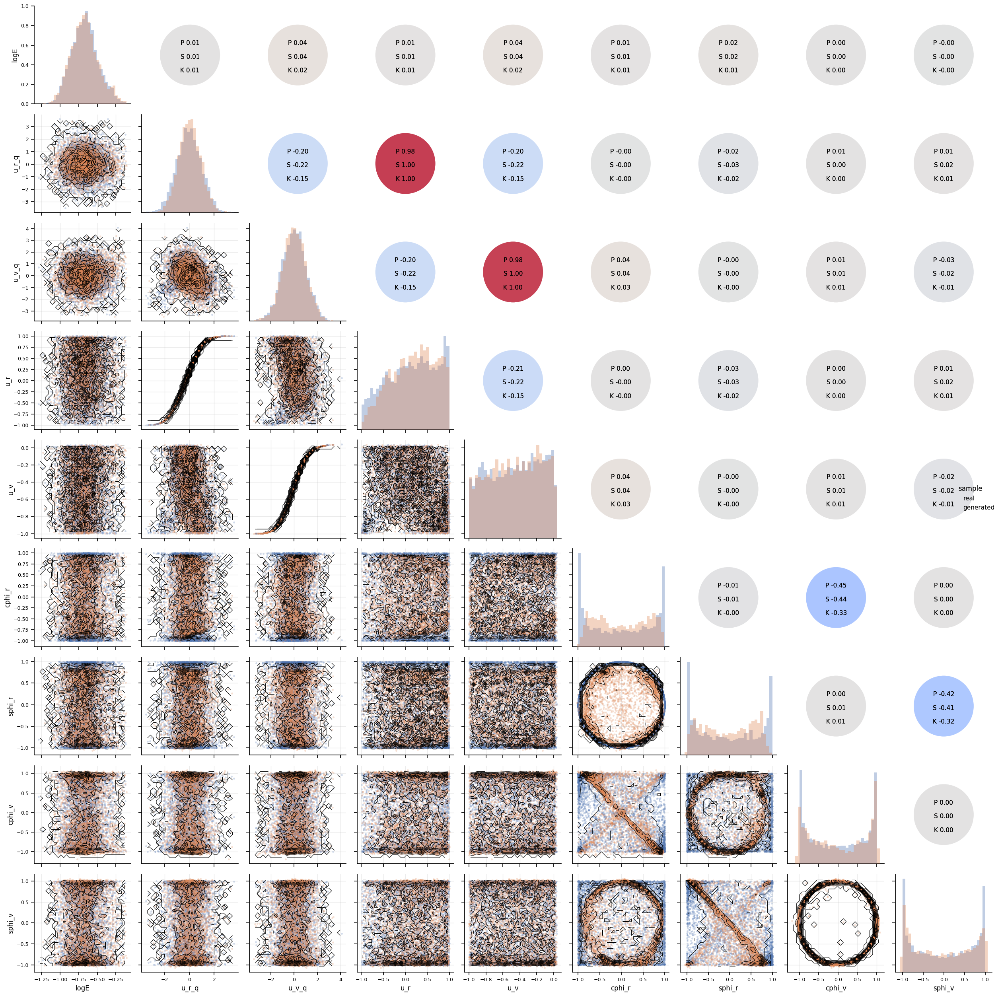

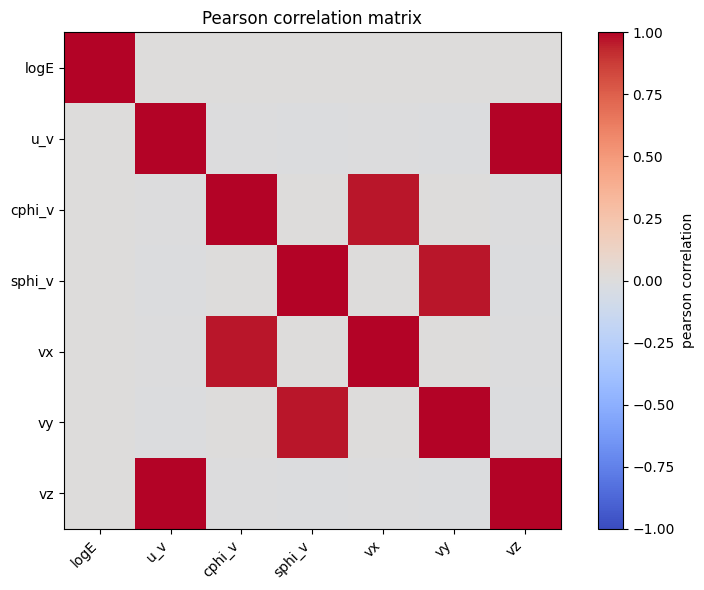

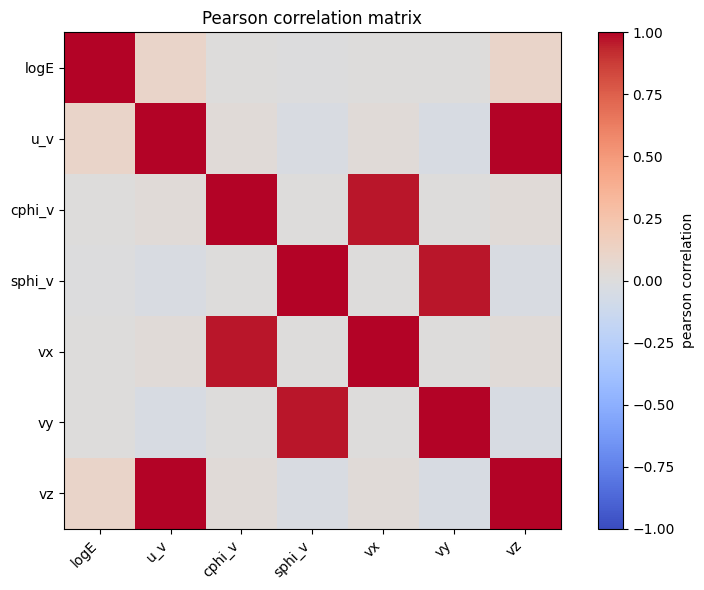

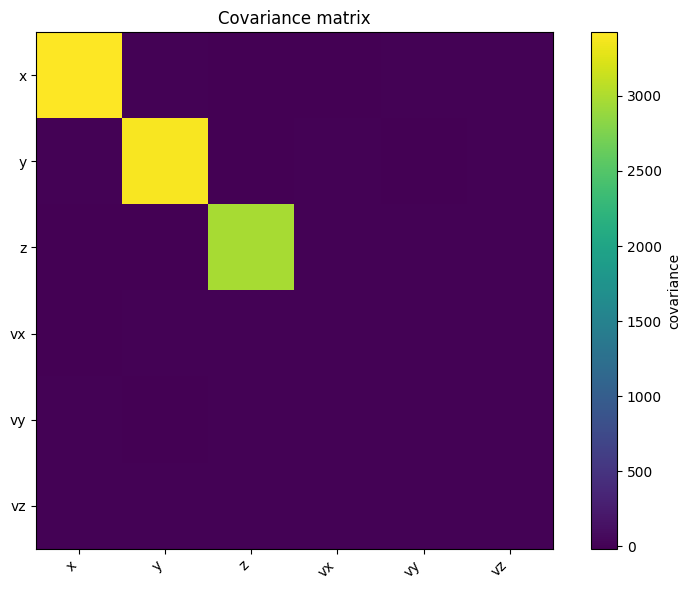

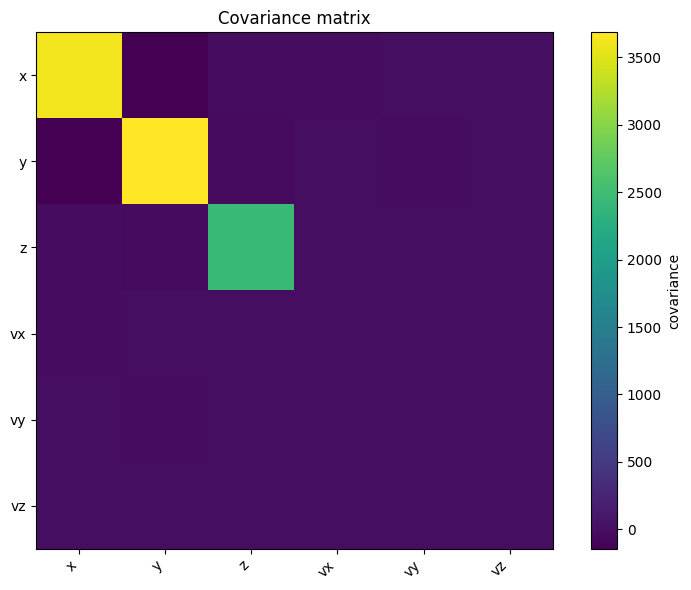

,x,y,z,vx,vy,vz
x,3613.862995,-145.185820,-20.760388,-21.553145,-0.458269,0.533122
y,-145.185820,3686.708554,-36.592330,0.744819,-20.385282,-0.139812
z,-20.760388,-36.592330,2431.901896,-0.073282,1.099677,-2.982157
vx,-21.553145,0.744819,-0.073282,0.365436,0.000679,0.004567
vy,-0.458269,-20.385282,1.099677,0.000679,0.342254,-0.007043
vz,0.533122,-0.139812,-2.982157,0.004567,-0.007043,0.086227


In [77]:
df_real_plot, df_gen_plot, df_compare = ge.build_real_generated_featureframes(real_phys, gen_phys)

corr_cols_compare = [
    "logE",

    # native model-space variables
    "u_r_q",
    "u_v_q",

    # physical variables after inverse quantile transform
    "u_r",
    "u_v",

    # angular variables
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

ge.plot_pairgrid_physics(
    df_compare,
    cols=corr_cols_compare,
    class_col="sample",
    sample_size=8000,
    lower_mode="scatter_contour",
)

ge.plot_correlation_matrix(
    df_real_plot,
    ["logE", "u_v", "cphi_v", "sphi_v", "vx", "vy", "vz"],
    method="pearson",
)

ge.plot_correlation_matrix(
    df_gen_plot,
    ["logE", "u_v", "cphi_v", "sphi_v", "vx", "vy", "vz"],
    method="pearson",
)

ge.plot_covariance_matrix(
    df_real_plot,
    ["x", "y", "z", "vx", "vy", "vz"],
)

ge.plot_covariance_matrix(
    df_gen_plot,
    ["x", "y", "z", "vx", "vy", "vz"],
)

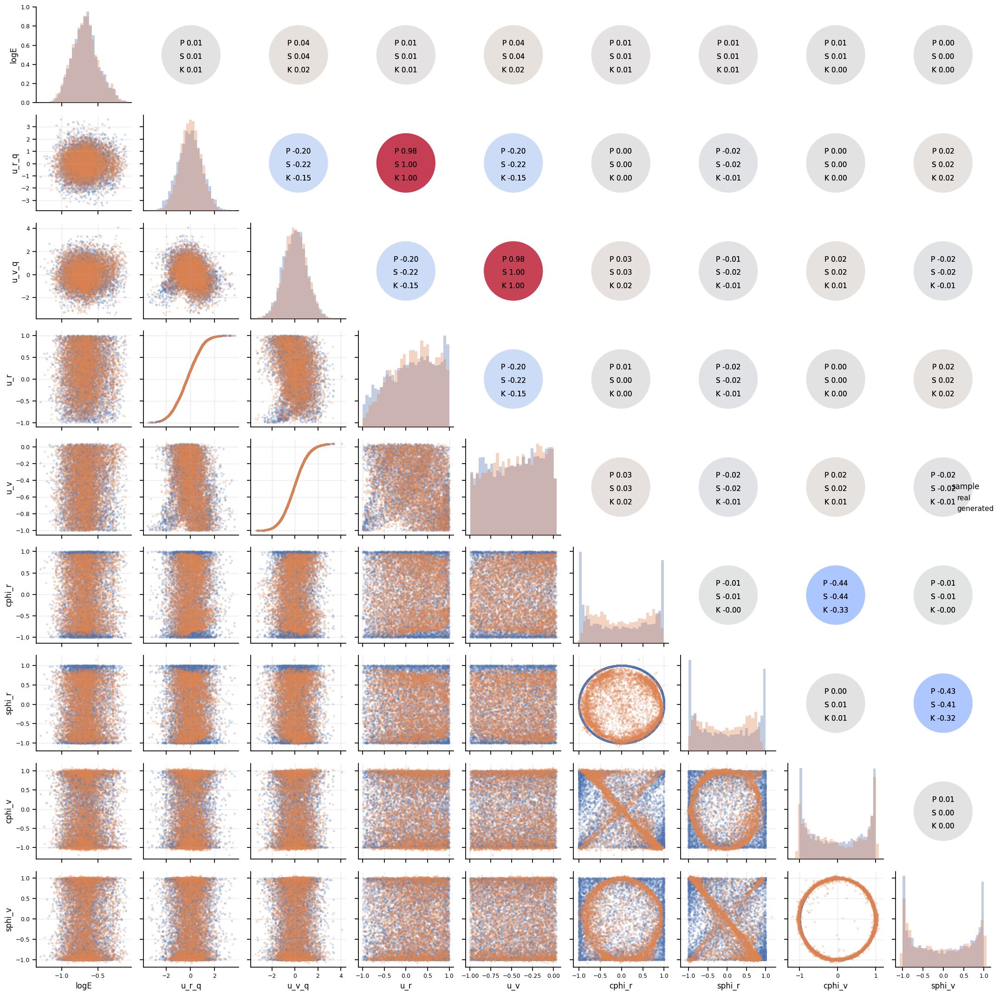

In [78]:
#df_real_plot, df_gen_plot, df_compare = ge.build_real_generated_featureframes(
#    real_phys,
#    gen_phys
#)

corr_cols_compare = [
    "logE",

    # native model-space variables
    "u_r_q",
    "u_v_q",

    # physical variables after inverse quantile transform
    "u_r",
    "u_v",

    # angular variables
    "cphi_r",
    "sphi_r",
    "cphi_v",
    "sphi_v",
]

ge.plot_pairgrid_physics(
    df_compare,
    cols=corr_cols_compare,
    class_col="sample",
    sample_size=10000,
    lower_mode="scatter",
    bins=30,
    contour_levels=8,
    figsize_scale=2.4,
)
plt.show()

## Saving Model

In [15]:
# ==========================================================
# Final model saving with metadata - v0.6.1
# ==========================================================

save_info = ge.save_final_trained_model(
    model=model,
    save_dir="trained_models/task_adaptive_energy_cont_run_001",
    model_name="task_adaptive_cvae_energy_cont",
    history=history,
    model_config=model_config,
    preprocessing_metadata=preprocessing_metadata,
    training_metadata={
        "epochs_requested": 40,
        "learning_rate": 2e-4,
        "seed": 42,
    },
    #evaluation_metadata=evaluation_metadata,
    callbacks=callbacks,
    notes="Final model. Energy task adaptively down-weighted using validation energy distribution metric.",
)

Saved final trained model to: trained_models/task_adaptive_energy_cont_run_001


In [14]:
ge.save_detector_table(
    gen_phys,
    filepath = "./checkpoints/generated_particles/generated_particles_run005.txt"
)

Saved detector table to: ./checkpoints/generated_particles/generated_particles_run005.txt
Rows saved: 1000000
Columns: ['ParticleName', 'Energy', 'X', 'Y', 'Z', 'Vx', 'Vy', 'Vz']


,ParticleName,Energy,X,Y,Z,Vx,Vy,Vz
0,gamma,0.371927,22.266296,-66.741013,-436.597717,-0.587907,0.530236,-0.610913
1,gamma,0.138404,70.133125,-22.537733,-440.033142,0.983339,0.162240,-0.081997
2,gamma,0.118521,-88.730530,29.851686,-542.813538,0.780520,-0.227227,-0.582371
3,gamma,0.223025,54.294277,-36.351582,-431.958649,0.094628,0.315862,-0.944075
4,gamma,0.168810,98.331024,-12.008483,-493.992310,-0.549858,0.653579,-0.520087
...,...,...,...,...,...,...,...,...
999995,gamma,0.146346,-78.174141,28.609215,-452.249573,0.923852,-0.306411,-0.229368
999996,gamma,0.178076,-78.931831,-61.382050,-506.242310,0.905655,0.357182,-0.228496
999997,gamma,0.171927,-79.921112,-60.081451,-505.976562,-0.701649,-0.417687,-0.577257
999998,gamma,0.194950,21.517126,-91.737595,-474.175293,0.264274,0.964338,-0.014558


# Generating Input Files for Geant4


In [12]:
### SKIP MODEL TRAINING AND DIRECTLY LOAD A TRAINED MODEL FOR GENETATION AND EVALUATION

# ==========================================================
# Configuration for later saving and reference
# ==========================================================


model_config = {
    "model_class": "CVAE_CatEnergy_CatUV_TaskAdaptive",
    "n_types": n_types,
    "n_energy_bins": n_energy_bins,
    "n_uv_bins": U_V_NBINS_EFF,
    "latent_dim": 8,
    "hidden": [128, 128, 64, 64, 64],
    "beta": 0.1,
    "w_energy": 0.8,
    "w_sr": 1.1,
    "w_uv": 1.1,
    "w_phi_r": 1.4,
    "w_phi_v": 1.1,
    "w_xy": 0.005,
    "w_vxy": 0.025,
    "w_ur": 0.01,
    "sphere_R": R,
}

preprocessing_metadata = {
    "s_r_mean": s_r_mean,
    "s_r_std": s_r_std,
    "energy_bins": energy_bins,
    "u_v_bins": u_v_bins,
    "u_v_centers": u_v_centers,
    "type_probs": type_probs,
    "idx_to_type": idx_to_type,
    "n_types": n_types,
    "energy_binning_mode": feature_pack["energy_config"]["mode"],
}

# ==========================================================

model = ge.load_task_adaptive_model_for_generation(
    save_dir="trained_models/task_adaptive_energy_run_005",
    model_name="task_adaptive_cvae_energy",
    model_config=model_config,
    energy_bins=energy_bins,
    u_v_bins=u_v_bins,
    n_types=n_types,
    type_weights=type_weights,
    radius=R,
    compile_model_fn=None,   # non serve per generare
    verbose=1,
)

Loaded task-adaptive model.
Weights: trained_models/task_adaptive_energy_run_005/task_adaptive_cvae_energy.weights.h5
Task weights: trained_models/task_adaptive_energy_run_005/task_adaptive_cvae_energy_task_weights.json
Current task weights: {'energy': 0.2097152000000001, 'sr': 1.1, 'uv': 1.1, 'phi_r': 1.4, 'phi_v': 1.1, 'xy': 0.005, 'vxy': 0.025, 'ur': 0.01}


In [12]:
ge.generate_detector_table_to_file(
    model=model,
    filepath="./generated/geant_input_10M.txt",
    n_events=10_000_000,
    type_probs=type_probs,
    n_types=n_types,
    idx_to_type=idx_to_type,
    s_r_mean=s_r_mean,
    s_r_std=s_r_std,
    energy_bins=energy_bins,
    u_v_bins=u_v_bins,
    center=(0.0, 0.0, -507.66),
    radius=100.0,
    chunk_size=100_000,
)

[GEEANNT] Generating chunk 0 -> 100000 / 10000000
[GEEANNT] Generating chunk 100000 -> 200000 / 10000000
[GEEANNT] Generating chunk 200000 -> 300000 / 10000000
[GEEANNT] Generating chunk 300000 -> 400000 / 10000000
[GEEANNT] Generating chunk 400000 -> 500000 / 10000000
[GEEANNT] Generating chunk 500000 -> 600000 / 10000000
[GEEANNT] Generating chunk 600000 -> 700000 / 10000000
[GEEANNT] Generating chunk 700000 -> 800000 / 10000000
[GEEANNT] Generating chunk 800000 -> 900000 / 10000000
[GEEANNT] Generating chunk 900000 -> 1000000 / 10000000
[GEEANNT] Generating chunk 1000000 -> 1100000 / 10000000
[GEEANNT] Generating chunk 1100000 -> 1200000 / 10000000
[GEEANNT] Generating chunk 1200000 -> 1300000 / 10000000
[GEEANNT] Generating chunk 1300000 -> 1400000 / 10000000
[GEEANNT] Generating chunk 1400000 -> 1500000 / 10000000
[GEEANNT] Generating chunk 1500000 -> 1600000 / 10000000
[GEEANNT] Generating chunk 1600000 -> 1700000 / 10000000
[GEEANNT] Generating chunk 1700000 -> 1800000 / 1000000

'./generated/geant_input_10M.txt'

## Test della pipeline standalone da integrare nel PrimaryGenerator di Geant
### RICORDA CHE TUTTO IL PREPROCESSING VA COMUNQUE INIZIALIZZATO

In [13]:
ge.generate_detector_input_file(
    save_dir="trained_models/task_adaptive_energy_run_005",
    model_name="task_adaptive_cvae_energy",
    model_config=model_config,
    energy_bins=energy_bins,
    u_v_bins=u_v_bins,
    n_types=n_types,
    type_weights=type_weights,
    type_probs=type_probs,
    idx_to_type=idx_to_type,
    s_r_mean=s_r_mean,
    s_r_std=s_r_std,
    output_file="./checkpoints/generated_particles/test_from_wrapper.txt",
    n_events=100_000,
    radius=100.0,
    center=(0.0, 0.0, -507.66),
    seed=1752008,
    chunk_size=50_000,
)

Loaded task-adaptive model.
Weights: trained_models/task_adaptive_energy_run_005/task_adaptive_cvae_energy.weights.h5
Task weights: trained_models/task_adaptive_energy_run_005/task_adaptive_cvae_energy_task_weights.json
Current task weights: {'energy': 0.2097152000000001, 'sr': 1.1, 'uv': 1.1, 'phi_r': 1.4, 'phi_v': 1.1, 'xy': 0.005, 'vxy': 0.025, 'ur': 0.01}
[GEEANNT] Generating chunk 0 -> 50000 / 100000
[GEEANNT] Generating chunk 50000 -> 100000 / 100000
[GEEANNT] Saved generated detector table to ./checkpoints/generated_particles/test_from_wrapper.txt


'./checkpoints/generated_particles/test_from_wrapper.txt'

In [16]:
cols_no_event_id = [
    "ParticleName", "Energy", "X", "Y", "Z", "Vx", "Vy", "Vz"
]

test_df = ge.load_detector_table(
    "./checkpoints/generated_particles/test_from_wrapper.txt",
    columns=cols_no_event_id,
    drop_event_id=False,
)

test_df.head()

/Users/francesco/Desktop/Università/Dottorato/GEEANNT/GEEANNT_package/GEEANNT/data/io.py:47: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support sep=None with delim_whitespace=False; you can avoid this warning by specifying engine='python'.
  df = pd.read_table(


,ParticleName,Energy,X,Y,Z,Vx,Vy,Vz
0,gamma,0.372275,22.266296,-66.741013,-436.597717,-0.587907,0.530236,-0.610913
1,gamma,0.137363,70.133125,-22.537733,-440.033142,0.983339,0.162240,-0.081997
2,gamma,0.118729,-88.730530,29.851686,-542.813538,0.780520,-0.227227,-0.582371
3,gamma,0.225034,54.294277,-36.351582,-431.958649,0.094628,0.315862,-0.944075
4,gamma,0.169715,98.331024,-12.008483,-493.992310,-0.549858,0.653579,-0.520087
